# Chasing Orbital Cyclicities in the Eastern Tropical Pacific

This notebook explores the results from the spectral, wavelet, and cross-wavelet analysis of a sea surface temperature reconstruction from Site ODP846 in the Eastern Equatorial Pacific. The worflow execution were done through [PaleoTS](http://linked.earth/paleoTS/), an automated system for the analysis of paleoclimate timeseries data. A description of the performed analyses is available [here](http://linked.earth/paleoTS/workflow.html).

This reproduces the work presented in [this Jupyter Notebook](https://github.com/LinkedEarth/PyleoclimPaper/blob/main/Orbital%20Cycles/Chasing%20orbital%20cyclicities.ipynb), which only took into consideration a fraction of the possible alternative methods for pre-processing and analysis.

First, let's import the necessary packages:
* the [wings package](https://pypi.org/project/wings/) (which allows to interface with the WINGS (PaleoTS) APIs without the GUI)
* [Pandas](https://pandas.pydata.org), which will be used to query the results based on the specific outputs, parameters and combination thereof
* [Pyleoclim](https://pyleoclim-util.readthedocs.io/en/master/) to parse the results of the analyses.
* [Seaborn](https://seaborn.pydata.org) for plotting purposes
* [Numpy](https://numpy.org) for basic array manipulation
* [Scipy](https://docs.scipy.org/doc/scipy/index.html) signal processing to identify spectral peaks. 
* [Climlab](https://climlab.readthedocs.io/en/latest/) to generate insolation curves. 

## Retrieve executions from the server

In [1]:
import wings
from wings.execution import Execution
from wings.data import Data

import os.path
import json
import pandas as pd
import time
import datetime

import pyleoclim as pyleo

import seaborn as sns
import numpy as np
from scipy.signal import find_peaks

import getpass

# For insolation curves, let's use climlab
from climlab.solar.orbital import OrbitalTable
from climlab.solar.insolation import daily_insolation

Tokenization took: 3.63 ms
Type conversion took: 2.09 ms
Parser memory cleanup took: 0.00 ms


The following cell contains login credentials for the runs on PaleoTS: 

In [2]:
SERVER = "https://datascience4all.org/wings-portal-new"
INTERNAL_SERVER = SERVER

USERID = "dkhider"
PASSWORD = getpass.getpass()
DOMAIN = "PaleoTS"

CACHEDIR = "data"

 ··········


We will be downloading the intermediate and final outputs of the various workflows. The following cell creates a `data` folder to store these outputs if it doesn't already exist.

In [3]:
if os.path.exists('data')==True:
    pass
else:
    cwd = os.getcwd()+'/'
    path = os.path.join(cwd, 'data')
    os.mkdir(path)

The following cells make the API calls to the PaleoTS system:

In [4]:
api = wings.ApiClient(server=SERVER, username=USERID, password=PASSWORD)
api.set_domain(DOMAIN)

In [5]:
execution_api = Execution(api)
data_api = Data(api)

The functions below allow parsing for the parameters and output/intermediate files:

In [6]:
def get_execution_parameters(exec):
    variables = exec["variables"]
    params = {}
    for var in variables["input"]:
        if var["type"] == 2:
            vbinding = var["binding"]
            if vbinding["type"] == "literal":
                varname = var["id"].split("#")[1]
                #dtype = vbinding["datatype"].split("#")[1]
                value = vbinding["value"]
                params[varname] = value
    return params

def get_execution_files(exec, file_types=[], fetch_datasets_for_variables=[]):
    variables = exec["variables"]
    files = {}
    allvars = []

    for file_type in file_types:
        allvars += variables[file_type]
    for var in allvars:
        if var["type"] == 1:
            vbinding = var["binding"]
            if vbinding["type"] == "uri":
                varname = var["id"].split("#")[1]
                location = None
                dataid = vbinding["id"]
                dataname = dataid.split("#")[1]
                # Download datasets for variables if needed
                if varname in fetch_datasets_for_variables:
                    location = CACHEDIR + "/" + dataname
                    if not os.path.exists(location):
                        data_api.fetch_data(dataid, location)
                    files[varname] = location
    return files

## Data Exploration

Our first task was to extract the sea surface temperature data from the file and build a dashboard. Let's have a look at the dashboard directly. First let's fetch the executions corresponding to our *LiPDDashboard* run:

In [37]:
execs_dashboard = execution_api.list_executions_by_page(pattern="LiPDDashboard*")

The Run ID is `LiPDDashboard-ea79dfcc-5a32-487a-9e93-22c53ab6d1a2`. Let's use it to find our results:

In [38]:
runid = 'LiPDDashboard-ea79dfcc-5a32-487a-9e93-22c53ab6d1a2'
exec_dashboard = execution_api.get_run_details(runid)

Let's display the dashboard directly:

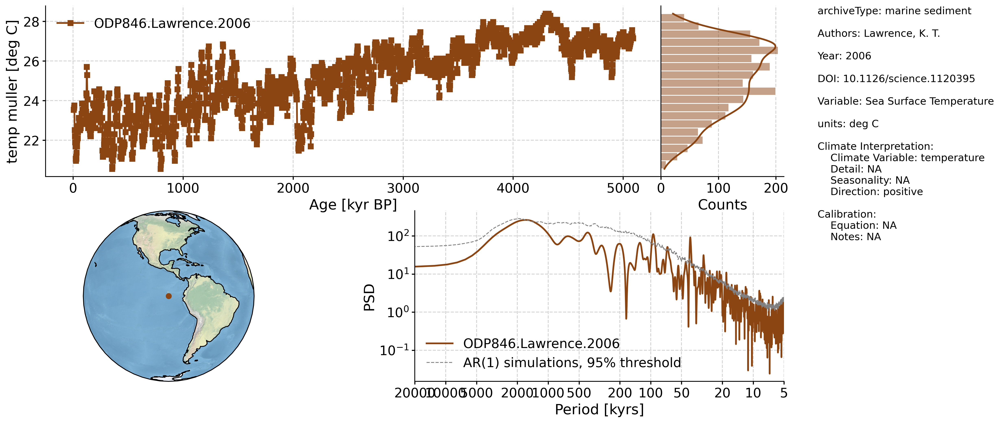

In [39]:
from IPython.display import Image

output_files = get_execution_files(exec_dashboard, ["intermediate", "output"], ["OutputPlot"]) #Name must match the name of the output file on the abstract workflow
Image(output_files['OutputPlot'])

The records display a long term colling trend characteristic of late Neogene and Quaternary. Superimposed on this trend are shorter term shifts that represent the ice ages. Preliminary spectral analysis of this record shows peak at ~40kyr and ~100ky, consistent with orbital cyclicities, specifically obliquity and eccentricity.

## Spectral Analysis

We used the Spectral Analysis workflow available in PaleoTS on the SST record. The workflow consists of 4 pre-processing steps: standardization, detetrending, removal of outliers, and regridding (hypothesizing over missing time values for spectral methods that require evenly-spaced data). These steps are follwed by spectral analysis and significance testing using an AR(1) benchmark.

<img src="images/spectral_workflow.svg">

**Figure 1**: Abstract spectral analysis template.

The `InputTS` input was set to `ODP846-SST`, which is a json-serialized version of a [Pyleoclim `Series`](https://pyleoclim-util.readthedocs.io/en/v0.9.1/core/api.html#series-pyleoclim-series). 

The parameters (in green in Figure 1) were set as followed:
* `TSID`: NA - This parameter is not needed when using a JSON input
* `remove`: This controls whether to remove outliers in a timeseries. It was set to take the value of either `True` or `False`.
* `start` and `stop` refers to the interval to consider for regridding. We used default values (which means to let Pyleoclim use the minimum and maximum time.
* `freq_method`: For `wwz`, `cwt`, and `lomb-scargle`, sets the method by which to obtain the [frequency vector](https://pyleoclim-util.readthedocs.io/en/v0.9.1/core/api.html#pyleoclim.core.series.Series.spectral). For this analysis, we set it to `lomb_scargle`.
* `qs` sets the red noise significance level. We used the default value of 0.95. 

Let's fecth the results from the spectral analysis workflow:

In [15]:
execs = execution_api.list_executions_by_page(pattern="SpectralAnalysis*")

Apply a start and end time for the analysis of interest to narrow down the search:

In [16]:
start_string = "12/14/2022 10:38:00-08:00" #Date and Time of the start of the runs, -08:00 accounts for PST timezone
start = time.mktime(datetime.datetime.strptime(start_string, '%m/%d/%Y %H:%M:%S%z').timetuple()) #convert to datetime

end_string = "12/16/2022 06:00:00-08:00"
end = time.mktime(datetime.datetime.strptime(end_string, '%m/%d/%Y %H:%M:%S%z').timetuple()) #convert to datetime

Get a list of all the executions within that time frame:

In [17]:
full_execs = []
if execs["success"]:
    for ex in execs["rows"]:
        runid = ex["id"].split("#")[1]
        status = ex["runtimeInfo"]["status"]
        startTime = ex["runtimeInfo"]["startTime"]
        if status == "SUCCESS" and startTime >= start and startTime <= end:
            #print(str(len(full_execs) + 1) + ". Run id: " + runid)
            exec = execution_api.get_run_details(runid)
            full_execs.append(exec)

Next, let's create a dataframe that will contains the parameters used for the execution, the name of the executable component (e.g., linear vs sline interpolation), and a link to the data files (all files are saved in the *data* folder created in previous steps). Specifically, we will retain the files corresponding to the following outputs as depicted in Figure 1:

- OutputTS7: The results from the detrending step
- OutputTS8: The results of the removing outlier step
- ClusterPlot: The figures containing the clustering results
- OutputTS9: The results from the regridding steps to an evenly-spaced time axis
- OutputPSDSig: The results of the spectral analysis, with significance. 

In [18]:
df = None
all_rows = []
for exec in full_execs:
    steps = exec["execution"]["plan"]["steps"]
    cvalues = {}
    for step in steps:
        cname = step["codeBinding"]["codeDirectory"].split("/")[-1]
        cvalues[cname] = True

    params = get_execution_parameters(exec)
    input_files = get_execution_files(exec, ["input"], ["InputTS"])
    output_files = get_execution_files(exec, ["intermediate", "output"], ["OutputTS7", "OutputTS8","ClusterPlot","OutputTS9","OutputPSD","OutputPSDSig"])

    row = dict(params)
    row.update(input_files)
    row.update(output_files)
    row.update(cvalues)

    if df is None:
        df = pd.DataFrame()
    
    df = pd.concat([df, pd.DataFrame([row])], ignore_index=True)

df.head()

,adaptive,max_clusters,start,NW,step,windowLength,deriv,polyorder,qs,remove,...,metric,min_samples,eps,nbr_clusters,n_neighbors,DBSCAN,DetrendLinear,NoDetrending,n,DetrendEMD
0,false,10,-1.0,-1.0,-1.0,-1,0,2,0.95,true,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,10,-1.0,NaN,-1.0,-1,0,2,0.95,true,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,10,-1.0,NaN,-1.0,-1,0,2,0.95,true,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,10,-1.0,NaN,-1.0,-1,0,2,0.95,true,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,10,-1.0,NaN,-1.0,-1,0,2,0.95,true,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Available columns for querying:

In [92]:
df.columns

Index(['adaptive', 'max_clusters', 'start', 'NW', 'step', 'windowLength',
       'deriv', 'polyorder', 'qs', 'remove', 'BW', 'jackknife', 'threshold',
       'freq_method', 'h', 'mode', 'low_bias', 'TSID', 'number', 'eval',
       'sides', 'seed', 'step_type', 'delta', 'nbr_cluster', 'stop', 'InputTS',
       'OutputPSD', 'OutputTS7', 'OutputTS8', 'OutputTS9', 'ClusterPlot',
       'OutputPSDSig', 'DetrendSG', 'gkernel', 'MTM', 'kmeans', 'AR1sim',
       'standardize', 'loadJSON', 'window', 'average', 'n50', 'LombScargle',
       'scaling', 'nfft', 'return_onesided', 'Periodogram', 'nperseg',
       'noverlap', 'Welch', 'mother', 'pad', 'cwt-psd', 'nproc', 'c', 'Neff',
       'wwz-psd', 'extrapolate', 'SplineInterpolation', 'LinearInterpolation',
       'bin', 'metric', 'min_samples', 'eps', 'nbr_clusters', 'n_neighbors',
       'DBSCAN', 'DetrendLinear', 'NoDetrending', 'n', 'DetrendEMD'],
      dtype='object')

Note that this dataframe contains information about the parameters for every method, the name of the methods themselves, and a link to the files containing the desired output. For instance, `LinearInterpolation` refers to the method of that name while `extrapolate` is a parameter for that particular method. NaNs entries means that the method or parameter is irrelevant for this particula execution.

### Effect of pre-processing on the timeseries

Pre-processing of the timeseries can affect results of the spectral analysis. Although it is difficult a priori to estimate the impact, some processing steps should be used carefully. Here, we used three pre-processing steps that could impact the results:

- detrending
- removal of outliers
- regridding through either interpolation between missing values (linear or spline interpolation) or coarsening (binning using the median in each bin or using a Gaussian Kernel).


#### Detrending

PaleoTS contains for possible detrending options:
- LinearDetrending: PaleoTS will prevent the use of this option is the trend cannot be considered linear. For our SST record, PaleoTS considered the trend to be linear. 
- Empiral Mode Decomposition
- Fitting with a Savitzy-Golay filter and removing the low-pass filter from the series
- No detrending: no removal of trends. This option is useful to benchmark the results against pre-processing steps.

Let's collect the various options:

In [15]:
detrended_output = df['OutputTS7'].unique()
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']
res ={}
for out in detrended_output:
    idx = df[df['OutputTS7']==out].first_valid_index()
    for item in detrend_opt:
        if df[item].iloc[idx]==True:
            res[item]=df['OutputTS7'].iloc[idx]
            
res    

{'DetrendSG': 'data/OutputTS7-1eldzvuo0mjsfaau6khda3mh9.json',
 'DetrendLinear': 'data/OutputTS7-b4x95u7i66ynztoenh5wxfuc5.json',
 'NoDetrending': 'data/OutputTS7-dm33un2juiu3qrf6ij5af0ys4.json',
 'DetrendEMD': 'data/OutputTS7-2twa4cumn3s16f85aunswqw1j.json'}

(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [kyr BP]', ylabel='temp muller [deg C]'>)

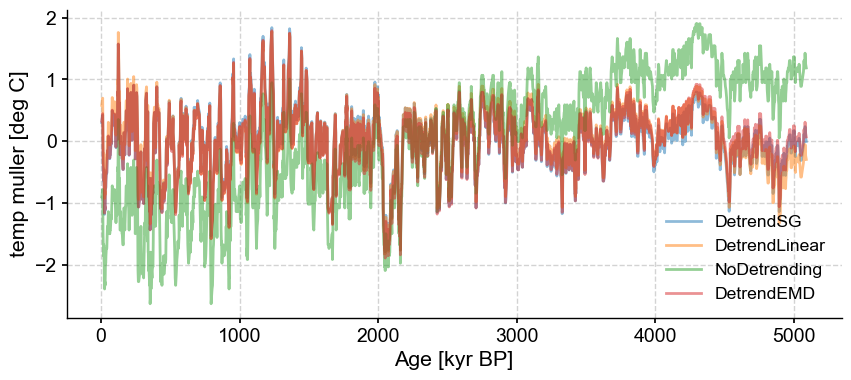

In [16]:
ts_detrend = []
for item in detrend_opt:
    ts = pyleo.utils.jsonutils.json_to_PyleoObj(res[item], 'Series')
    ts.label = item
    ts_detrend.append(ts)
    
ms = pyleo.MultipleSeries(ts_detrend)
ms.plot(plot_kwargs={'alpha':0.5})

All the detrending methods result in very similar outcomes, and there is no reason to prefer one method over the other. In the original study, the linear method was disregarded since the trend did not appear to be linear.

#### Effect of outliers

PaleoTS (via Pyleoclim) can [detect and remove outliers](https://github.com/LinkedEarth/PyleoTutorials/blob/main/notebooks/L2_outliers_detection.ipynb) through two clustering methods:

- DBSCAN
- kmeans

Let's examine the results from each.

##### Clustering through DBSCAN

In [44]:
files = []

for item in detrend_opt:
    outlier = df[df['DBSCAN']==True][df[item]==True][df['remove']=='true']['ClusterPlot'].unique() #note that the cluster plot will be the same reagrdless of whether the indices were subsequently removed
    files.append(outlier[0])

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/3014215627.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outlier = df[df['DBSCAN']==True][df[item]==True][df['remove']=='true']['ClusterPlot'].unique() #note that the cluster plot will be the same reagrdless of whether the indices were subsequently removed


Detrended with method: DetrendSG


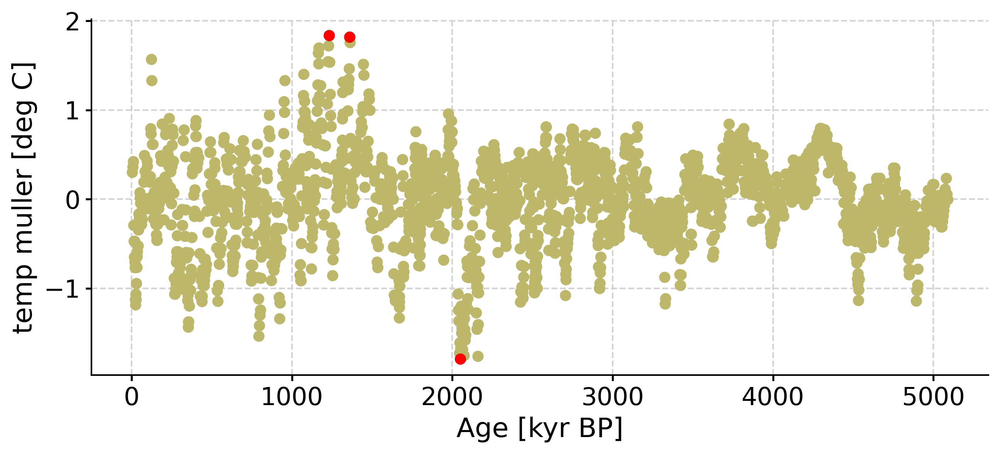

In [45]:
print("Detrended with method: "+detrend_opt[0])
Image(files[0])

Detrended with method: DetrendLinear


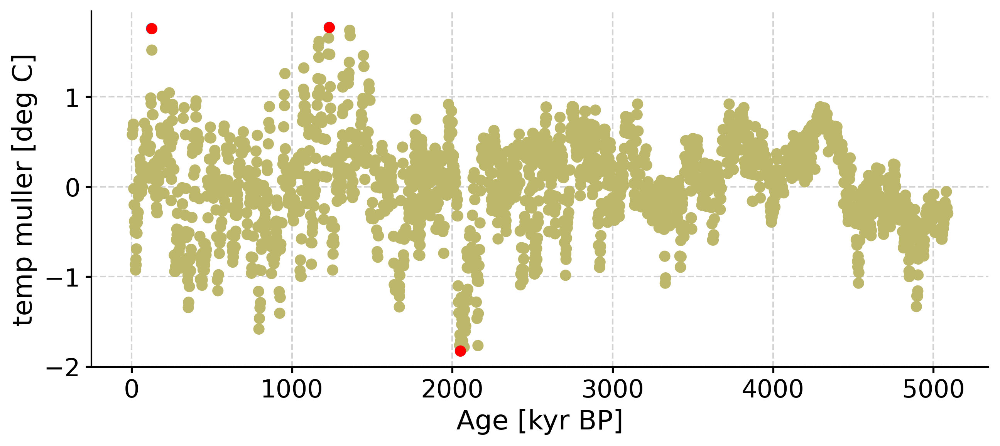

In [46]:
print("Detrended with method: "+detrend_opt[1])
Image(files[1])

Detrended with method: NoDetrending


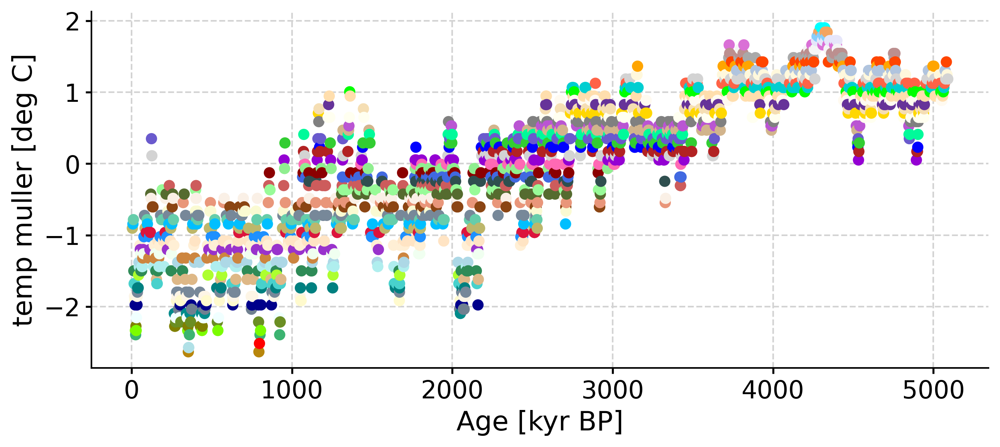

In [47]:
print("Detrended with method: "+detrend_opt[2])
Image(files[2])

Detrended with method: DetrendEMD


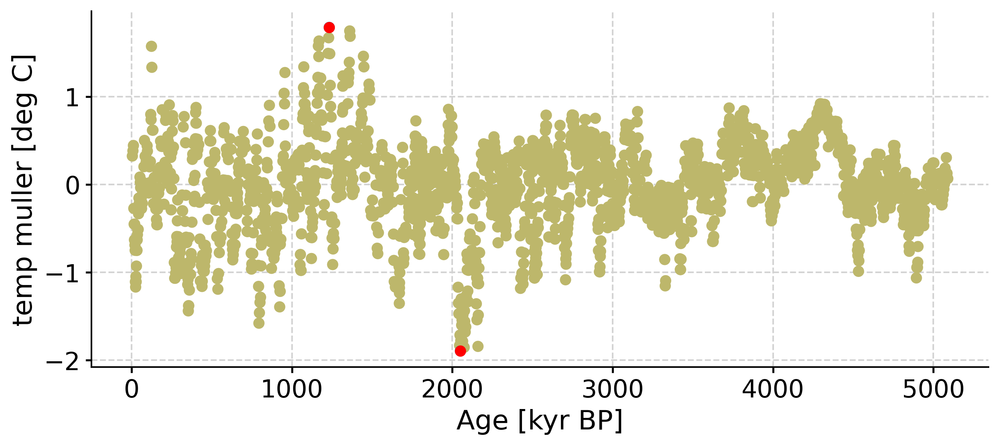

In [48]:
print("Detrended with method: "+detrend_opt[3])
Image(files[3])

With detrending not applied a priori, most cycles are detected as part of differnet clusters, and very few points result in outliers. With detrending, the time series is considered as part of one cluster with very few outliers. The location of the outliers seems to depend on the detrending option applied before hand. It doesn't seem useful to remove the 2-3 points detected by the algorithm. We ran PaleoTS with the "remove" option set as both True/False. As far as DBSCAN is concerned, let's process with the option `remove == false`.

This is consistent with visual observation of the timeseries where no outliers stand out. 

##### Clustering with kmeans

In [50]:
files = []

for item in detrend_opt:
    outlier = df[df['kmeans']==True][df[item]==True][df['remove']=='true']['ClusterPlot'].unique() #note that the cluster plot will be the same reagrdless of whether the indices were subsequently removed
    files.append(outlier[0])

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/1248940749.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outlier = df[df['kmeans']==True][df[item]==True][df['remove']=='true']['ClusterPlot'].unique() #note that the cluster plot will be the same reagrdless of whether the indices were subsequently removed


Detrended with method: DetrendSG


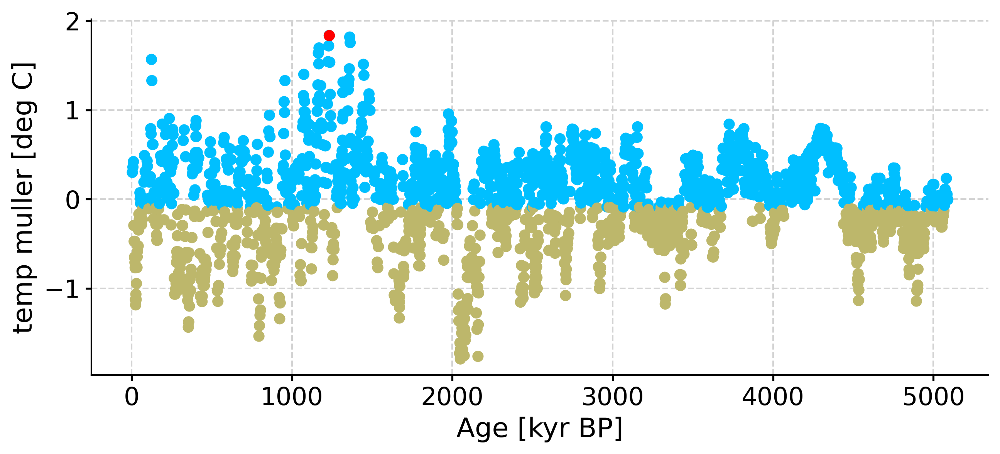

In [51]:
print("Detrended with method: "+detrend_opt[0])
Image(files[0])

Detrended with method: DetrendLinear


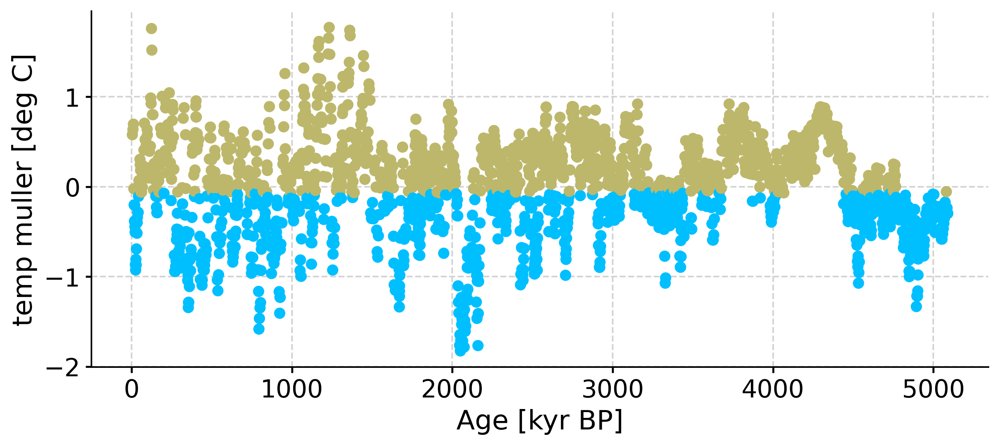

In [52]:
print("Detrended with method: "+detrend_opt[1])
Image(files[1])

Detrended with method: NoDetrending


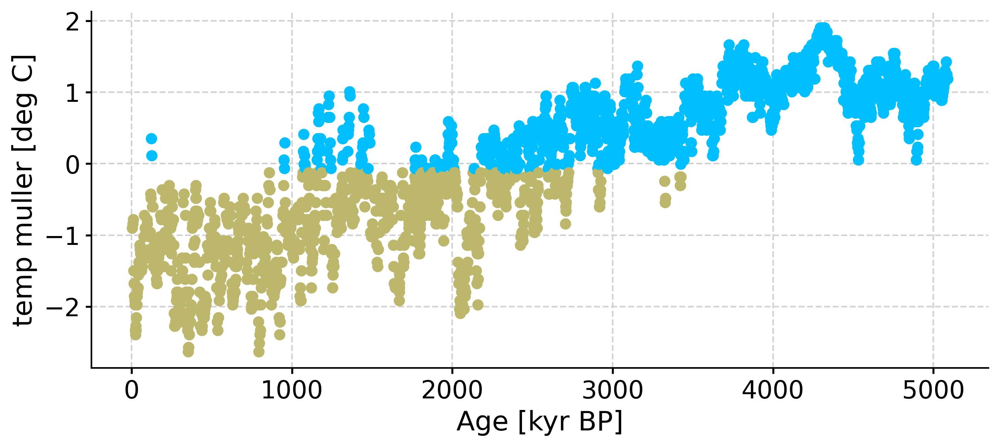

In [53]:
print("Detrended with method: "+detrend_opt[2])
Image(files[2])

Detrended with method: DetrendEMD


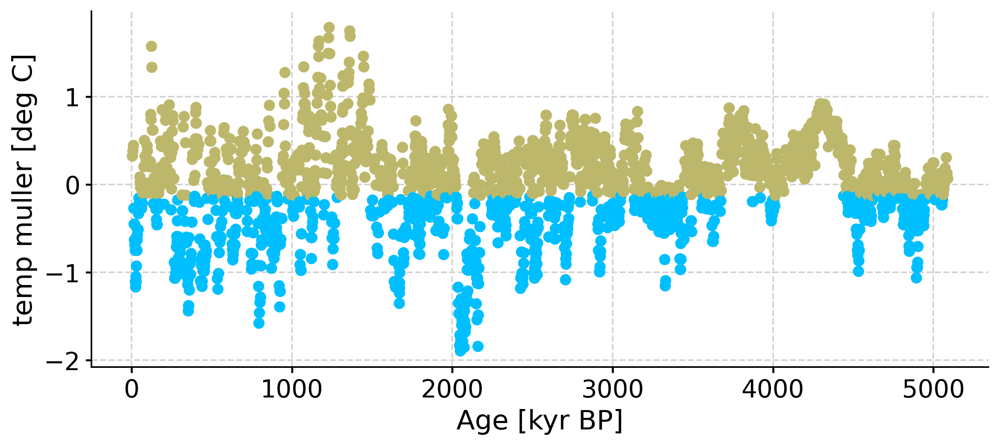

In [54]:
print("Detrended with method: "+detrend_opt[3])
Image(files[3])

With the exception of one outlier detected when the series is detrended using a Savitzy-Golay filter, no outliers are detected. This gives us confidence that keeping the results where `remove == false` is appropriate for our problem.

#### Effect of regridding

For specific spectral methods (Periodogram, Welch, and MTM), the series needs to be placed on an evenly-spaced grid in time. PaleoTS offers several options to do so:

- interpolation (which results in the creation of new data points) through linear and spline interpolation
- coarsening though binning and apply a Gaussian Kernel

Let's have a look at the timeseries after these steps. For convenience, let's concentrate on the 'EMD' detrending method (with no outlier removal; for coding purposes we will limit the search to the 'DBSCAN' method but since no data point is removed in the outlier step, the two methods will result in identical outputs as far as the Series is concerned).

##### Interpolation

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/3769497150.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  files = df[df['DBSCAN']==True][df['DetrendEMD']==True][df['remove']=='false'][df[item]==True]['OutputTS9'].unique()


(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [kyr BP]', ylabel='temp muller [deg C]'>)

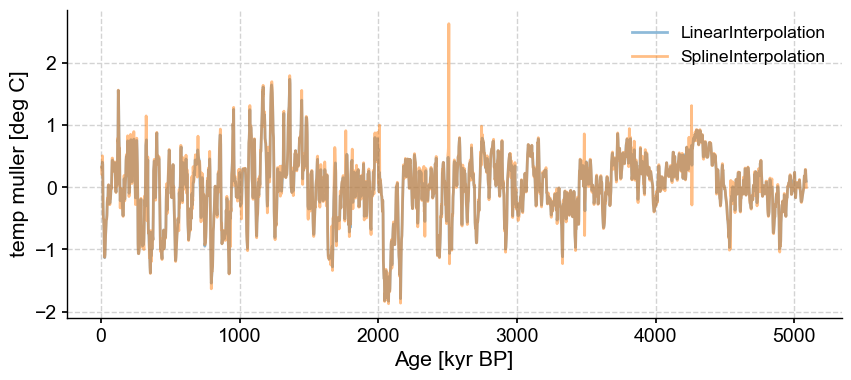

In [72]:
interp_opt = ['LinearInterpolation','SplineInterpolation']
ts_interp=[]
for item in interp_opt:
    files = df[df['DBSCAN']==True][df['DetrendEMD']==True][df['remove']=='false'][df[item]==True]['OutputTS9'].unique()
    for string in files:
        if 'TS9' in string: #ignore OutputTS9 that are direct copies of OutputTS8 if the regridding step is skipped
            ts = pyleo.utils.jsonutils.json_to_PyleoObj(string, 'Series')
            ts.label = item
            ts_interp.append(ts)

ms_interp = pyleo.MultipleSeries(ts_interp)
ms_interp.plot(plot_kwargs={'alpha':0.5})            

The spline interpolation results in some spurious data and will be ignored in further analyis. Let's investigate whether this is a problem with other interpolation steps, in this case, Savitzy-Golay:

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/1514737376.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  files = df[df['DBSCAN']==True][df['DetrendSG']==True][df['remove']=='false'][df[item]==True]['OutputTS9'].unique()


(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [kyr BP]', ylabel='temp muller [deg C]'>)

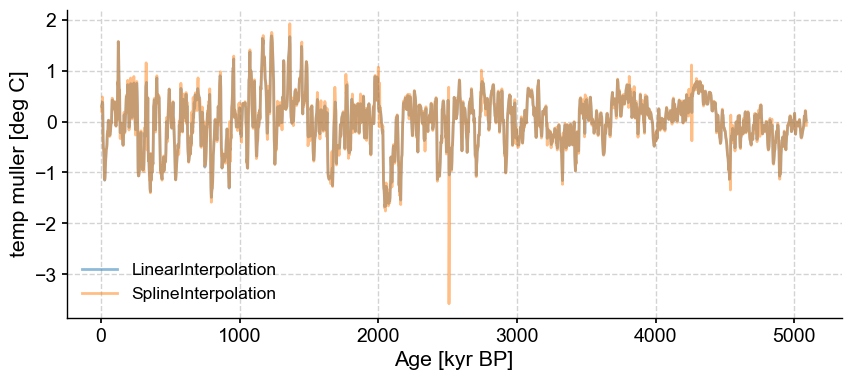

In [77]:
interp_opt = ['LinearInterpolation','SplineInterpolation']
ts_interp=[]
for item in interp_opt:
    files = df[df['DBSCAN']==True][df['DetrendSG']==True][df['remove']=='false'][df[item]==True]['OutputTS9'].unique()
    for string in files:
        if 'TS9' in string: #ignore OutputTS9 that are direct copies of OutputTS8 if the regridding step is skipped
            ts = pyleo.utils.jsonutils.json_to_PyleoObj(string, 'Series')
            ts.label = item
            ts_interp.append(ts)

ms_interp = pyleo.MultipleSeries(ts_interp)
ms_interp.plot(plot_kwargs={'alpha':0.5})            

The problem persists, although in different location. For the purpose of analysis of periodicities, we will ignore the outputs obtained with regridding using a spline interpolation.

Note that this is often a problem with spline interpolation and is not particular to this time series.

##### Coarsening

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/1109549466.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  files = df[df['DBSCAN']==True][df['DetrendEMD']==True][df['remove']=='false'][df[item]==True]['OutputTS9'].unique()


(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [kyr BP]', ylabel='temp muller [deg C]'>)

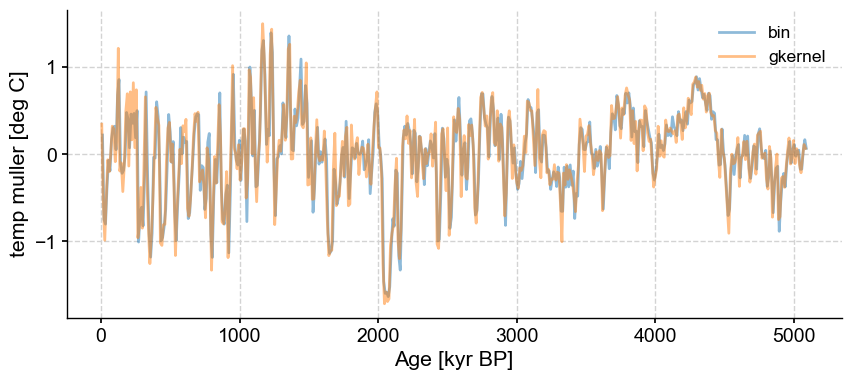

In [74]:
coarse_opt = ['bin','gkernel']
ts_coarse=[]
for item in coarse_opt:
    files = df[df['DBSCAN']==True][df['DetrendEMD']==True][df['remove']=='false'][df[item]==True]['OutputTS9'].unique()
    for string in files:
        if 'TS9' in string: #ignore OutputTS9 that are direct copies of OutputTS8 if the regridding step is skipped
            ts = pyleo.utils.jsonutils.json_to_PyleoObj(string, 'Series')
            ts.label = item
            ts_coarse.append(ts)

ms_coarse = pyleo.MultipleSeries(ts_coarse)
ms_coarse.plot(plot_kwargs={'alpha':0.5})            

Let's compare the gkernel method to the detrended output directly:

(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [kyr BP]', ylabel='temp muller [deg C]'>)

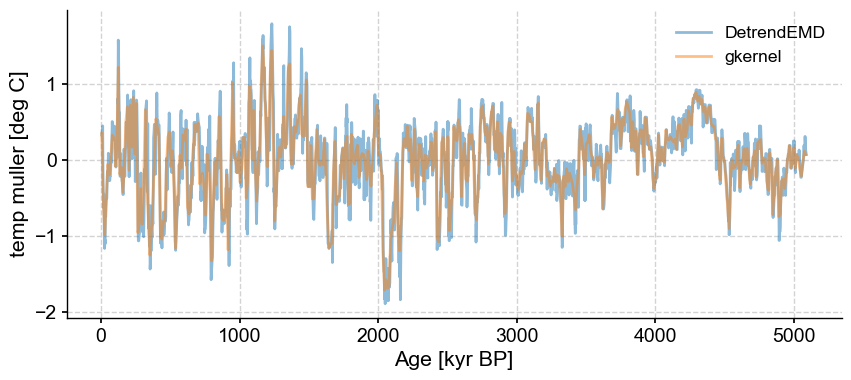

In [79]:
ms_comp = pyleo.MultipleSeries([ts_detrend[3],ts_coarse[1]])
ms_comp.plot(plot_kwargs={'alpha':0.5})

Let's do the same with binning:

(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [kyr BP]', ylabel='temp muller [deg C]'>)

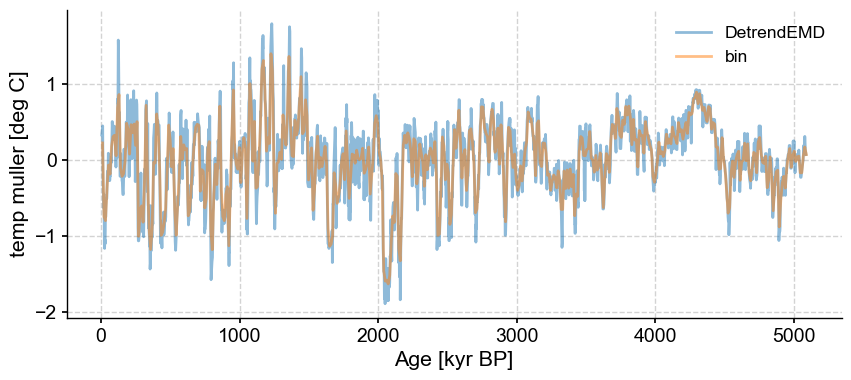

In [80]:
ms_comp = pyleo.MultipleSeries([ts_detrend[3],ts_coarse[0]])
ms_comp.plot(plot_kwargs={'alpha':0.5})

Either of the coarsening methods seems reasonable. 

### Power in the orbital band

Given the results of our sensitivity analysis on the various pre-processing methods, we will consider the following steps to investigate the impacts of the statistical methods on our conclusions:

- Detrending using the linear, Savitzy-Golay, EMD or no detrending.
- No removal of outliers
- For methods requiring regridding: linear interpolation, binning and gkernel.

#### Methods geared towards non-evenly spaced timeseries: Weighted Wavelet Z-Transform and Lomb-Scargle

##### Lomb-Scargle

In [93]:
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']
psd_LS =[]

for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LombScargle']==True]['OutputPSDSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = item
        psd_LS.append(psd)

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/2111696200.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LombScargle']==True]['OutputPSDSig'].unique()


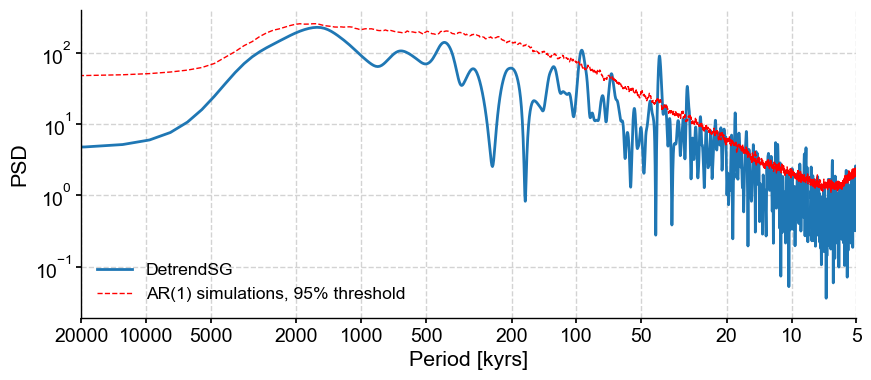

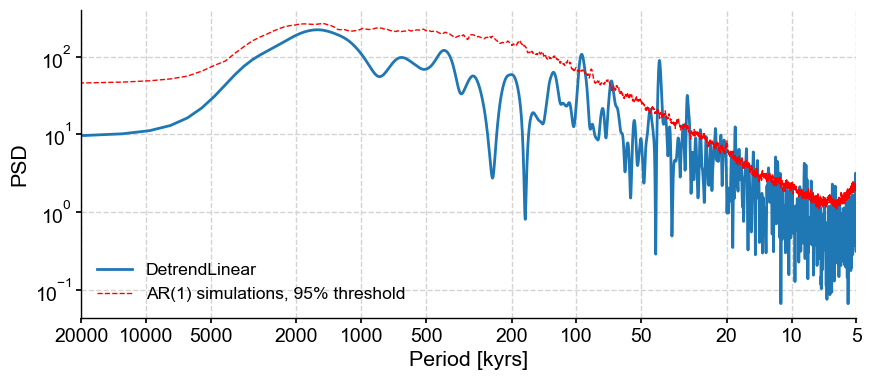

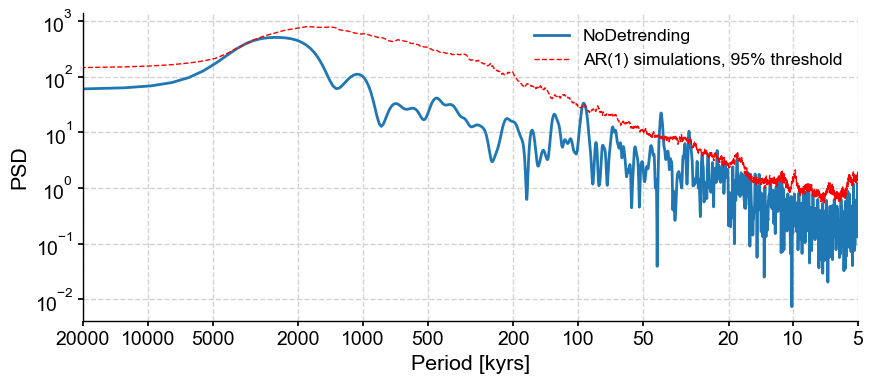

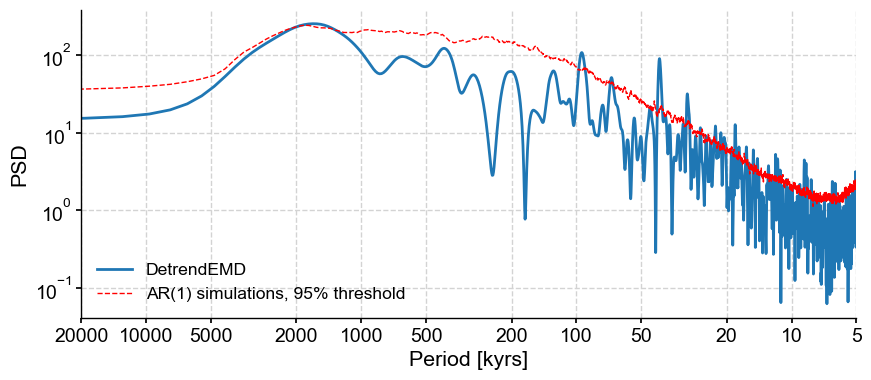

In [94]:
for psd in psd_LS:
    psd.plot()

The record displays significant periodicities around and 100 kyr and singificant peaks in the precessional and obliquity band (23-40 kyr). The singificance of these peaks is more muted when no detrending was applied prior to spectral analysis, which is not suprising given the large long-term trend in the data, resulting in more power in frequencies lower than orbital cyclicities.

##### Weighted Wavelet Z Transform

In [95]:
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']
psd_wwz =[]

for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['wwz-psd']==True]['OutputPSDSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = item
        psd_wwz.append(psd)

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/308786051.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['wwz-psd']==True]['OutputPSDSig'].unique()


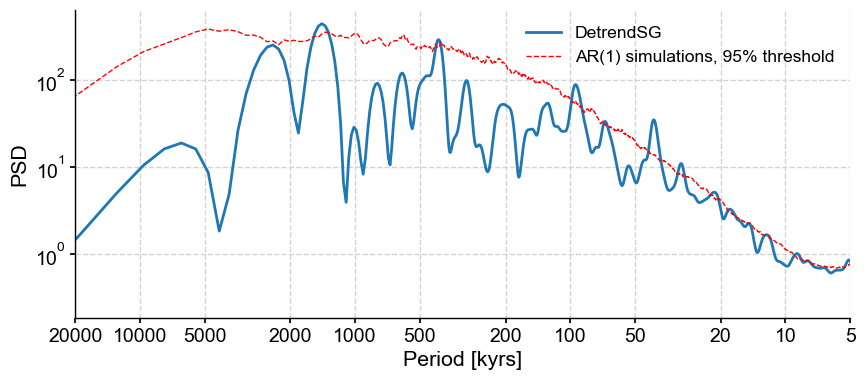

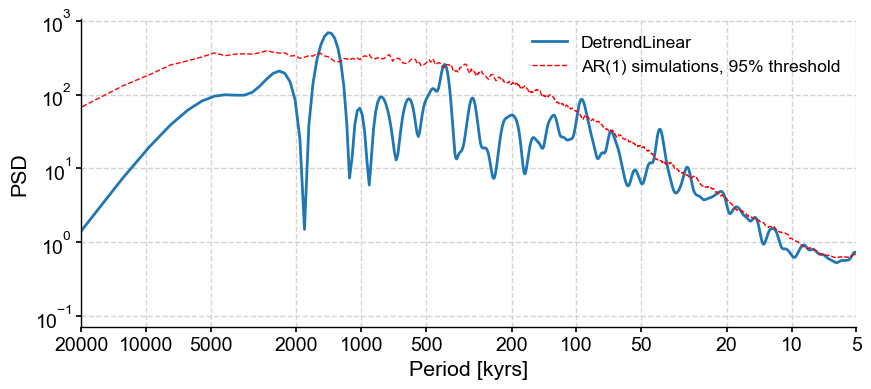

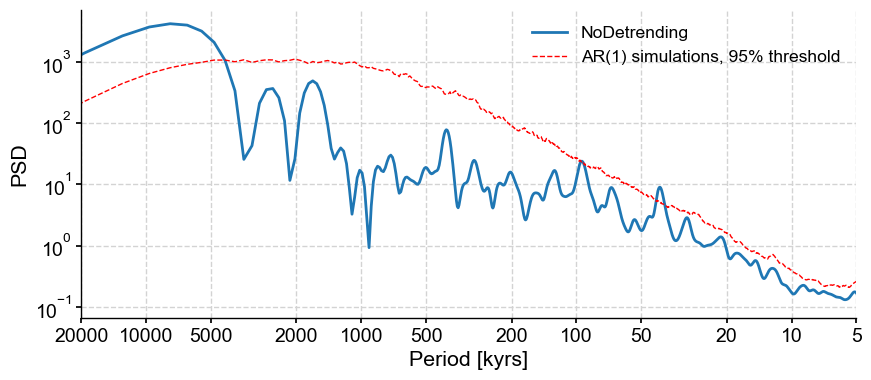

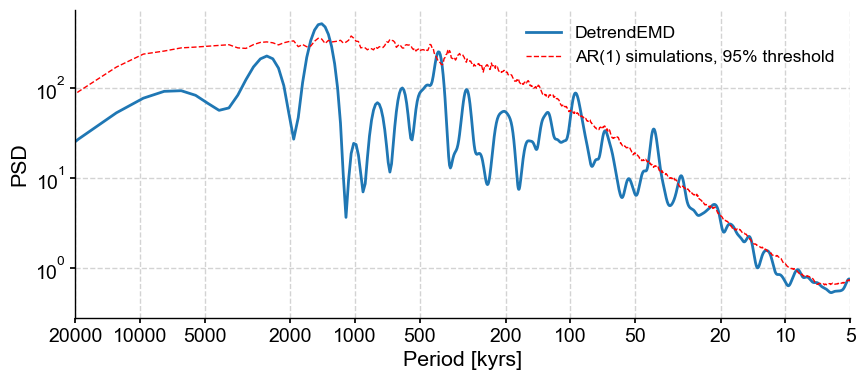

In [96]:
for psd in psd_wwz:
    psd.plot()

Similarly, we observed periodicities at 100kyr. With WWZ, the 40kyr band is more defined, with some cyclicities also defined around 23kyr (precession).

##### Comparison between the two methods

Let's plot the PSD obtained from Lomb-Scargle and WWZ on the same plots, ignoring the significance tests.

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/410996021.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['wwz-psd']==True]['OutputPSD'].unique()
/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/410996021.py:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LombScargle']==True]['OutputPSD'].unique()


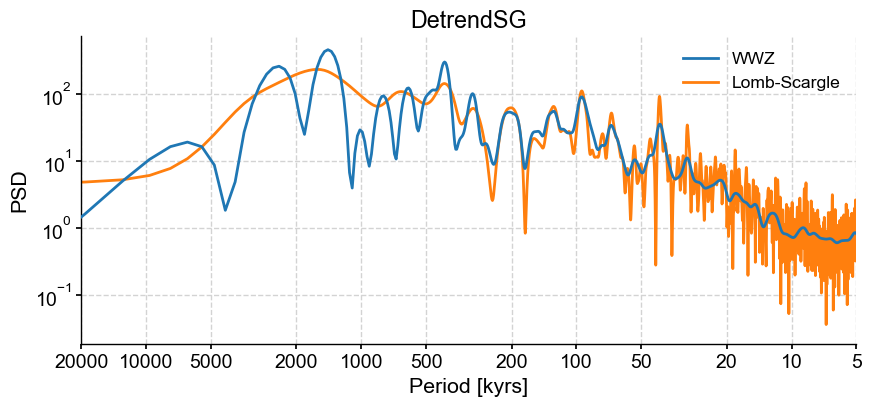

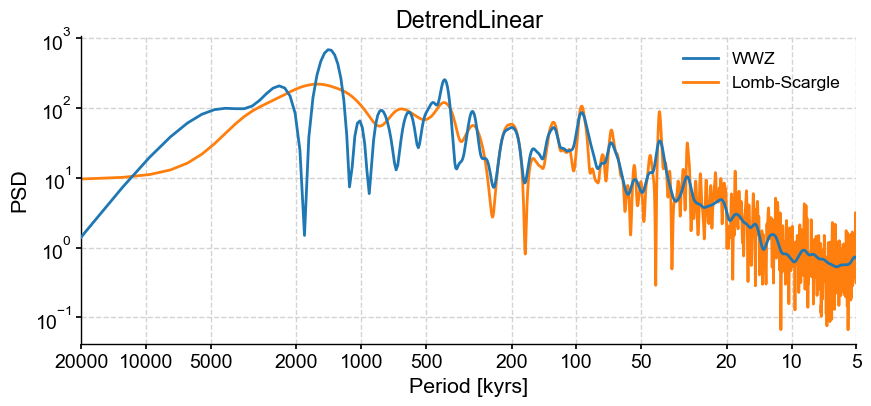

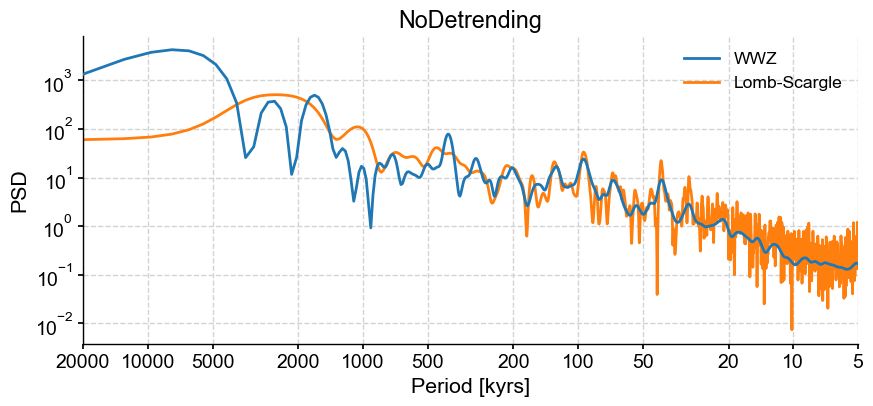

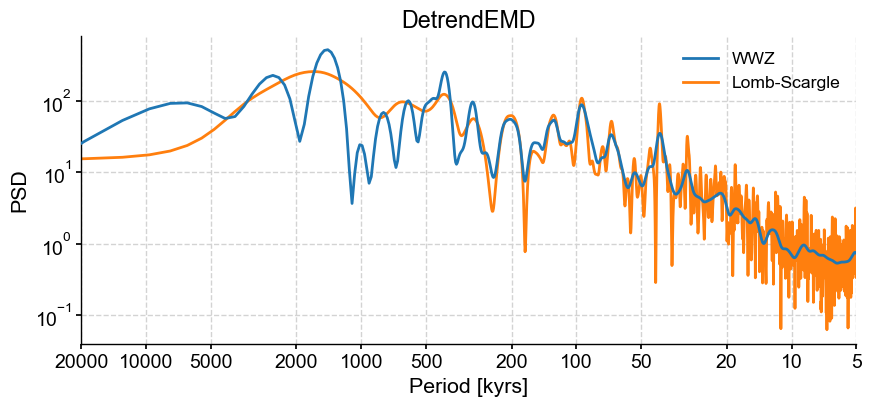

In [98]:
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']

#WWZ psds
psd_wwz =[]
for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['wwz-psd']==True]['OutputPSD'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = 'WWZ'
        psd_wwz.append(psd)

#Lomb-Scargle psds
psd_LS =[]
for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LombScargle']==True]['OutputPSD'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = 'Lomb-Scargle'
        psd_LS.append(psd)

#plot

for idx,item in enumerate(psd_wwz):
    fig,ax=item.plot(title=detrend_opt[idx],zorder=5)
    psd_LS[idx].plot(ax=ax)

The noise in the high frequencies from Lomb-Scargle is expected; however, both methods return similar results for periodicities greater than 20kyr, which correspond to the orbital band. 

#### General signal-processing methods

##### Periodogram

The most basic signal processing method is Periodogram obtained through Fourier Transform. Let's first examine the effects of trends on the results (we will assume a linear interpolation): 

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/4072030982.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LinearInterpolation']==True][df['Periodogram']==True]['OutputPSDSig'].unique()


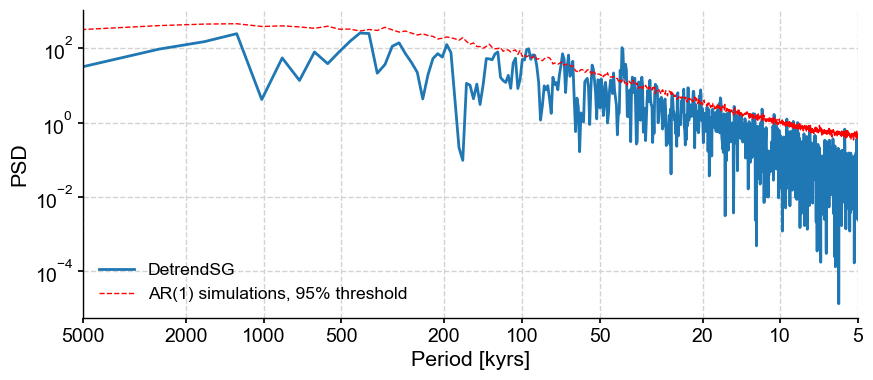

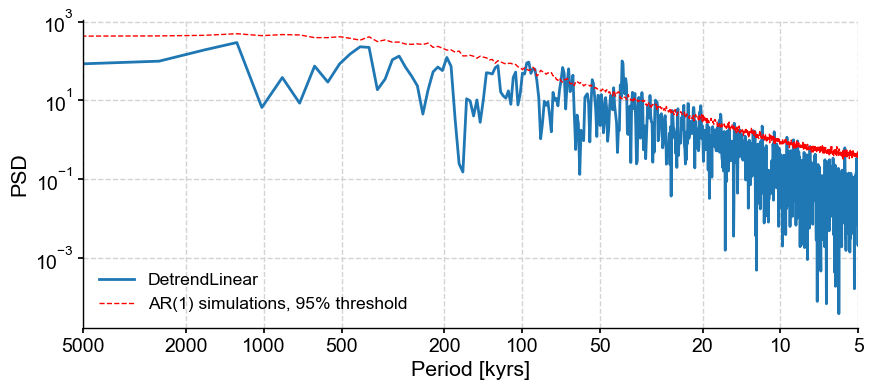

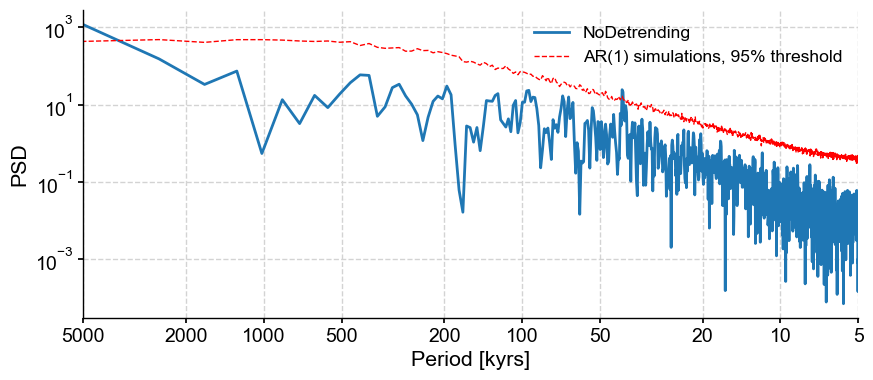

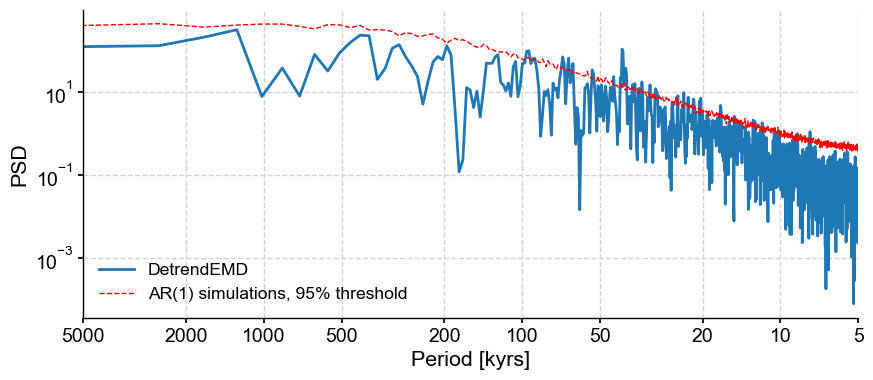

In [100]:
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']
psd_per =[]

for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LinearInterpolation']==True][df['Periodogram']==True]['OutputPSDSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = item
        psd_per.append(psd)

for psd in psd_per:
    psd.plot()

The detection of these orbital cycles are more muted when using a simple Fourier transform, with the cycle corresponding to eccentricity losing its significance when the series is not properly detrended. 

Let's have a look at the influence of our regridding approach (using a detrending approach through EMD):

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/2337895241.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['DetrendEMD']==True][df['Periodogram']==True]['OutputPSDSig'].unique()


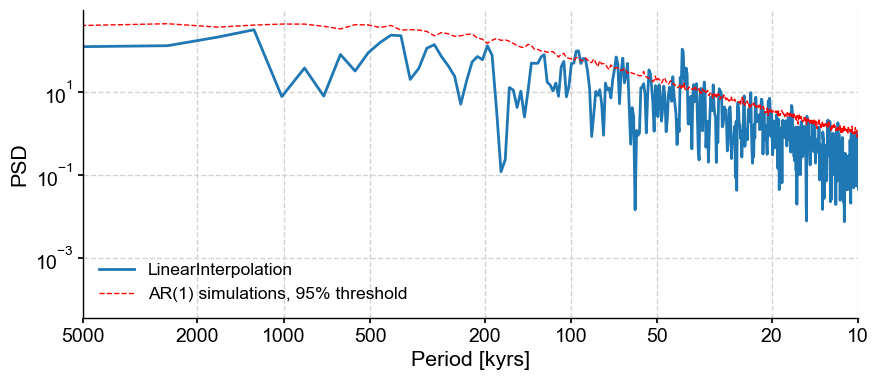

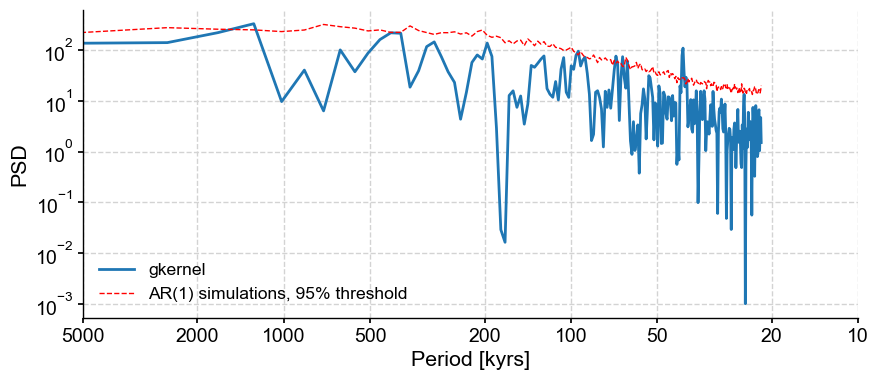

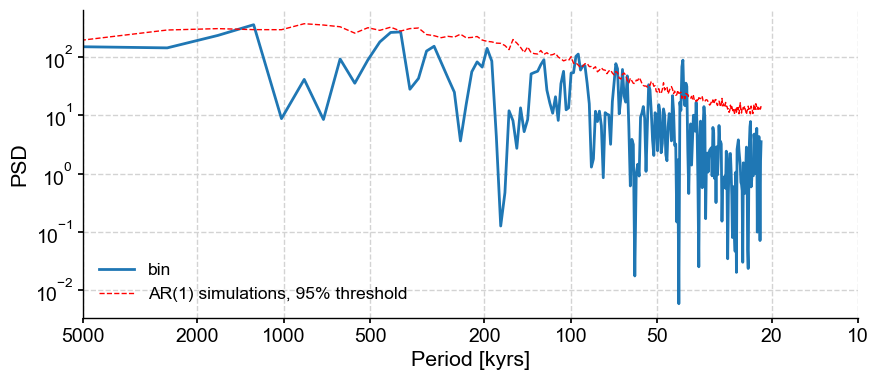

In [127]:
regrid_opt = ['LinearInterpolation','gkernel','bin']
psd_per =[]

for item in regrid_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['DetrendEMD']==True][df['Periodogram']==True]['OutputPSDSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = item
        psd_per.append(psd)

for psd in psd_per:
    xticks = [10,20,50,100,200,500,1000,2000,5000]
    fig,ax = psd.plot(xlim=[10,5000])
    ax.invert_xaxis()
    ax.set_xticks(xticks)

The choice of regridding method impacts the location of peaks below a periodicity of ~70kyr, making the peaks corresponsing to obliquity and precession more spurious.

##### Welch

The Welch method employs an overlapping segment approach to reduce the noise in the estimated periodogram (at the expanse of reducing the frequency resolution). 

Let's look at the effect of detrending:

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/3598719699.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LinearInterpolation']==True][df['Welch']==True]['OutputPSDSig'].unique()


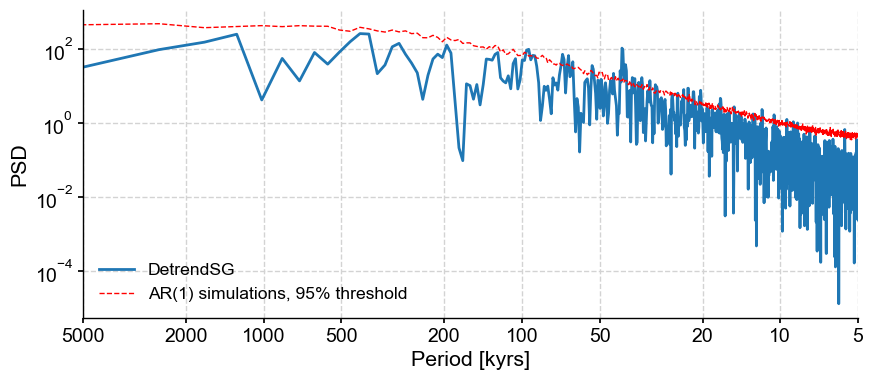

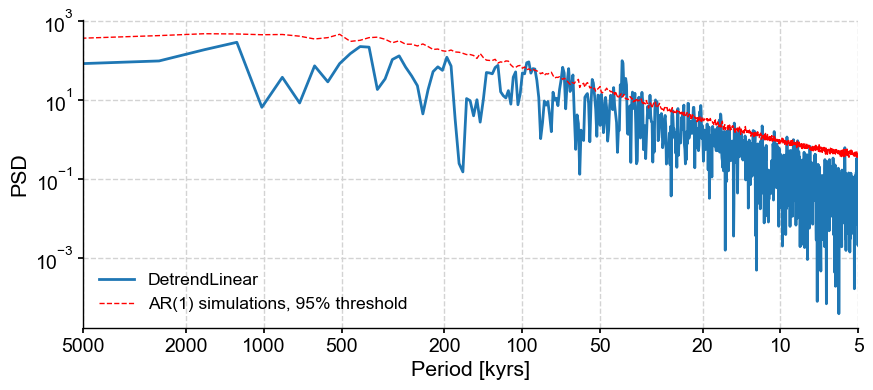

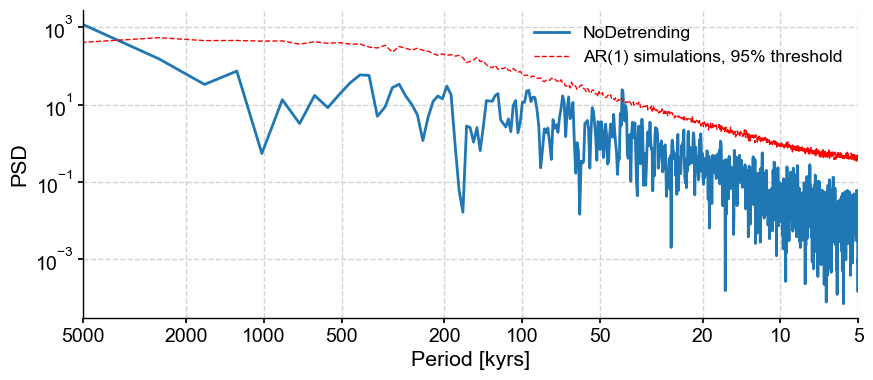

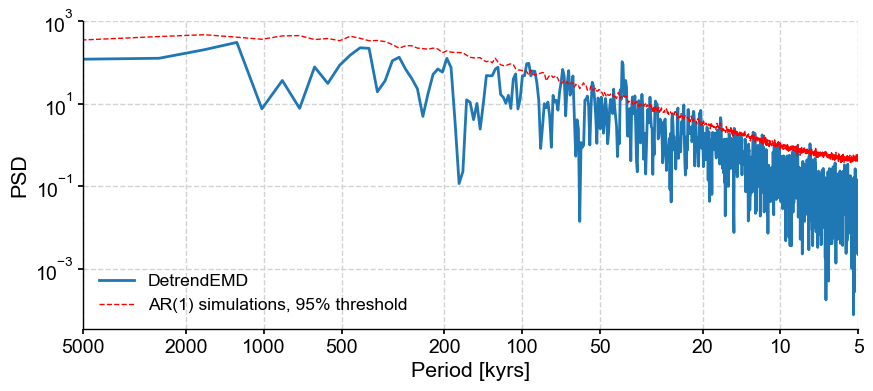

In [132]:
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']
psd_welch =[]

for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LinearInterpolation']==True][df['Welch']==True]['OutputPSDSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = item
        psd_welch.append(psd)

for psd in psd_welch:
    psd.plot()

The results from the Welch method are similar to that obtained from the Periodogram, which is not surprising since these two methods share the same windowing and transform. 

##### MTM

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_2804/4064512486.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LinearInterpolation']==True][df['Welch']==True]['OutputPSDSig'].unique()


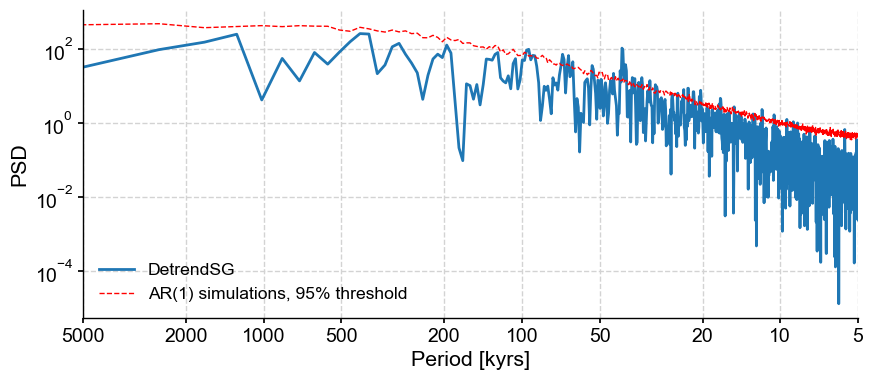

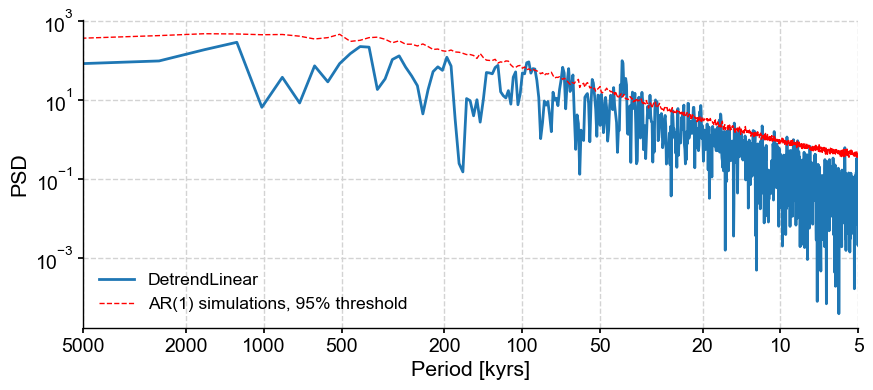

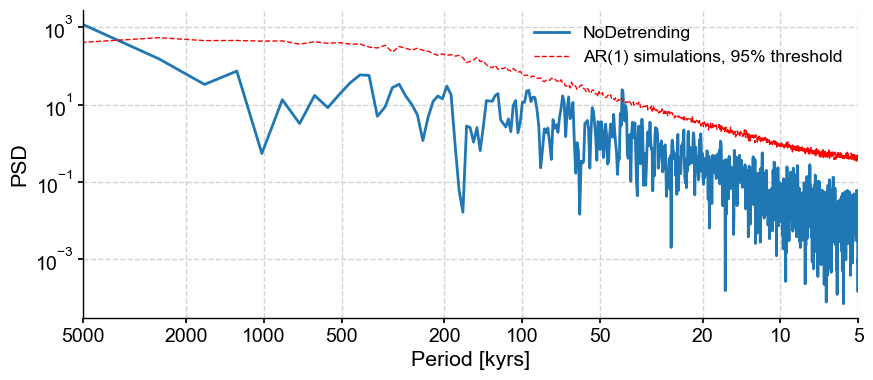

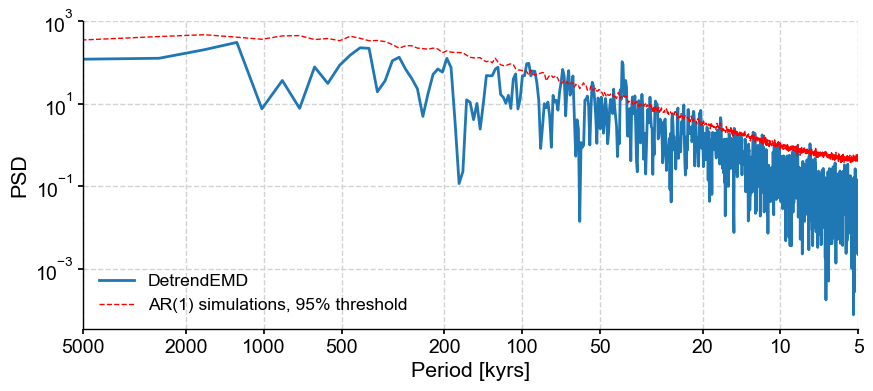

In [133]:
detrend_opt = ['DetrendSG','DetrendLinear','NoDetrending','DetrendEMD']
psd_mtm =[]

for item in detrend_opt:
    file = df[df['DBSCAN']==True][df[item]==True][df['remove']=='false'][df['LinearInterpolation']==True][df['Welch']==True]['OutputPSDSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        psd=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'PSD')
        psd.label = item
        psd_mtm.append(psd)

for psd in psd_mtm:
    psd.plot()

We obtain very similar results using the MTM method. 

**Preliminary conclusions**: Regardless of the spectral method used and the pre-processing applied to the timeseries (with the exception of no detrending, which may not be the best choice given the strong trend in this particular timeseries), the sea surface temperature record displays significant periodicities in the orbital band, defined broadly as the 20-100kyr band.

The question remains as to whether the specific peaks associated with the known eccentricity, obliquity, and precession cycles can be specifically isolated.

#### Peaks associated with eccentricity, obliquity, and precession

Let's consider how many peaks are present in the 17-120kyr band and how far from the known periodicity is the tallest peak that can be indentified within tolerance. Tolerance here was set by trial and error depending on the number of points associated with each frequency band. 

First, let's only consider the runs with the following pre-processing steps:

- Detrending using the linear, Savitzy-Golay, EMD
- No removal of outliers
- For methods requiring regridding: linear interpolation, binning and gkernel
- Let's also ingore the spectral analysis done through `cwt-psd`, which tends to smooth out all frequencies

In [19]:
df_out = df[df['DBSCAN']==True][df['remove']=='false'][df['NoDetrending'].isna()][df['SplineInterpolation'].isna()][df['cwt-psd'].isna()]
len(df_out)

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_3898/1619735975.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_out = df[df['DBSCAN']==True][df['remove']=='false'][df['NoDetrending'].isna()][df['SplineInterpolation'].isna()][df['cwt-psd'].isna()]


45

Given the exclusion criteria, we are left with 45 possibilities. 

The following function allows to estimate
(1) the number of peaks within the orbital band
(2) the value of the tallest peak closest to know orbital cyclicities within a tolerance. Note that the tolerance is not the same for each band since the frequency vector is not evenly-spaced in most cases, with lower df in the lower frequencies. 
(3) The three "tallest peak" compared to red noise.

In [21]:
def find_orbital_peaks(psd, period_range = [17,120], tol = [3,5,15]):
    # number of peaks in band
    mask = [False for i in range(np.size(psd.frequency))]
    mask |= (psd.frequency>=1/period_range[1]) & (psd.frequency<=1/period_range[0])
    freq_orbital = psd.frequency[mask]
    amp_orbital = psd.amplitude[mask]
    peaks_idx = find_peaks(amp_orbital)[0]
    #Do the same to the significance
    amp_idx = amp_orbital[peaks_idx]
    sig_amp = psd.signif_qs.psd_list[0].amplitude[mask][peaks_idx]
    peaks_nbr = 0
    for idx,item in enumerate(sig_amp):
        if amp_idx[idx]>=item:
            peaks_nbr+=1
    # highest peaks
    dis = amp_idx-sig_amp
    peak_highest = np.sort(dis)[::-1][0:2]

    # find the peaks
    cycle_list= [23,41,100]
    cycle_found=[]
    nbr_of_points = []
    for idx_c,item in enumerate(cycle_list):
        mask = [False for i in range(np.size(psd.frequency))]
        mask |= (psd.frequency>=1/(item+tol[idx_c])) & (psd.frequency<=1/(item-tol[idx_c]))
        freq_orbital = psd.frequency[mask]
        nbr_of_points.append(len(freq_orbital))
        amp_orbital = psd.amplitude[mask]
        #Find the tallest peak and ignore the rest
        try:
            peaks_idx = find_peaks(amp_orbital, distance = len(freq_orbital))[0]
            amp_idx = amp_orbital[peaks_idx]
            sig_amp = psd.signif_qs.psd_list[0].amplitude[mask][peaks_idx]
            if amp_idx >= sig_amp:
                cycle_found.append(1/freq_orbital[peaks_idx][0])
            else:
                cycle_found.append(np.nan)
        except:
            cycle_found.append(np.nan)
    
    
    return peaks_nbr, cycle_found, nbr_of_points, peak_highest

In [22]:
detrend_method = []
regrid_method = []
spectral_method = []
nbr_of_peaks = []
eccentricity = []
obliquity = []
precession = []
nbr_of_points = []
highest_peak = []

# possible methods
detrend_options = ['DetrendSG','DetrendLinear','DetrendEMD']
regrid_options = ['LinearInterpolation','bin','gkernel']
spectral_options = ['MTM','LombScargle','Periodogram','Welch','wwz-psd']

for idx,row in df_out.iterrows():
    # Get the detrending method
    for item in detrend_options:
        if row[item] == True:
            detrend_method.append(item)
    for item in regrid_options:
        if row[item] == True:
            if row['LombScargle']==True or row['wwz-psd']==True:
                regrid_method.append('Not applied') #PaleoTS keeps the memory of what it planned to run even though it skipped.  
            else:
                regrid_method.append(item)
    for item in spectral_options:
        if row[item] == True:
            spectral_method.append(item)
    psd = pyleo.utils.json_to_PyleoObj(row['OutputPSDSig'],'PSD')
    peaks_nbr, cycle_found, points, peaks = find_orbital_peaks(psd, period_range = [17,120], tol = [3,5,15])
    nbr_of_peaks.append(peaks_nbr)
    eccentricity.append(cycle_found[2])
    obliquity.append(cycle_found[1])
    precession.append(cycle_found[0])
    nbr_of_points.append(points)
    highest_peak.append(peaks[0])

Let's reconstruct a DataFrame for further analysis

In [23]:
df_spectral_summary = pd.DataFrame({'detrend_method' : detrend_method,
                                    'regrid_method' : regrid_method,
                                    'spectral_method' : spectral_method,
                                    'nbr_of_peaks' : nbr_of_peaks,
                                    'eccentricity' : eccentricity,
                                    'obliquity': obliquity,
                                    'precession': precession,
                                   'strongest_cycle':highest_peak})

df_spectral_summary.head()

,detrend_method,regrid_method,spectral_method,nbr_of_peaks,eccentricity,obliquity,precession,strongest_cycle
0,DetrendSG,gkernel,MTM,5,89.332158,40.412167,NaN,12.995945
1,DetrendSG,Not applied,LombScargle,14,94.463235,41.088486,22.591442,70.595325
2,DetrendSG,gkernel,Periodogram,5,NaN,40.735464,NaN,84.400829
3,DetrendSG,gkernel,Welch,6,94.295056,40.735464,NaN,92.159204
4,DetrendSG,Not applied,wwz-psd,6,94.463235,40.957492,21.411667,32.056399


In [24]:
df_spectral_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   detrend_method   45 non-null     object 
 1   regrid_method    45 non-null     object 
 2   spectral_method  45 non-null     object 
 3   nbr_of_peaks     45 non-null     int64  
 4   eccentricity     43 non-null     float64
 5   obliquity        45 non-null     float64
 6   precession       27 non-null     float64
 7   strongest_cycle  45 non-null     float64
dtypes: float64(4), int64(1), object(3)
memory usage: 2.9+ KB


Periodicities close to the eccentricity signal is found in 43 out of the 45 combinations of pre-processing and analysis steps and the obliquity signal is present in all combinations. However, the precession signal can only be identified in 27 runs. Let's assess whether this is due to the method:

In [330]:
df_precession = df_spectral_summary[df_spectral_summary['precession'].isna()]

df_precession

,detrend_method,regrid_method,spectral_method,nbr_of_peaks,eccentricity,obliquity,precession
0,DetrendSG,gkernel,MTM,5,89.332158,40.412167,NaN
2,DetrendSG,gkernel,Periodogram,5,NaN,40.735464,NaN
3,DetrendSG,gkernel,Welch,6,94.295056,40.735464,NaN
6,DetrendSG,bin,MTM,6,89.332158,40.412167,NaN
7,DetrendLinear,gkernel,MTM,5,89.332158,40.412167,NaN
8,DetrendEMD,gkernel,MTM,5,89.332158,40.412167,NaN
14,DetrendSG,bin,Periodogram,7,94.295056,40.735464,NaN
15,DetrendLinear,gkernel,Periodogram,6,94.295056,40.735464,NaN
16,DetrendEMD,gkernel,Periodogram,6,94.295056,40.735464,NaN
18,DetrendSG,bin,Welch,7,94.295056,40.735464,NaN


The precession signal seems to be absent when the time series was coarsened in pre-processing. The coarsening step is taken as the maximum stop in the timeseries, in this case:

In [331]:
ts = pyleo.utils.jsonutils.json_to_PyleoObj(df.iloc[0,:]['InputTS'],'Series')
np.max(np.diff(ts.time))

10.856999999999971

10kyr, which is half the precession step. This might explains why the precession cannot be accurately detected.

##### Number of peaks

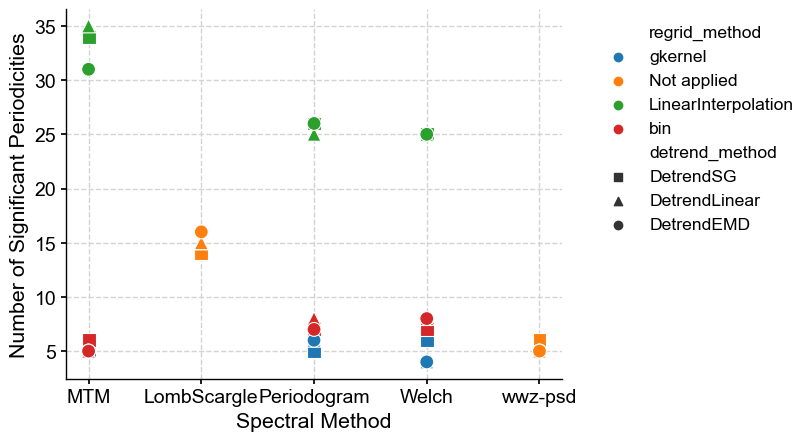

In [344]:
ax = sns.scatterplot(df_spectral_summary, x = 'spectral_method', y = 'nbr_of_peaks', hue = 'regrid_method', 
                     style = 'detrend_method', markers=['s','^','o'], legend='brief', s=100)
ax.set_xlabel('Spectral Method')
ax.set_ylabel('Number of Significant Periodicities')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

As expected, the linear interpolation creates more noise in the data, adding significant peaks throughout the orbital band. For the methods not requiring regridding, WWZ creates less variance than Lomb-Scargle, which is to be expected. 

##### Eccentricity

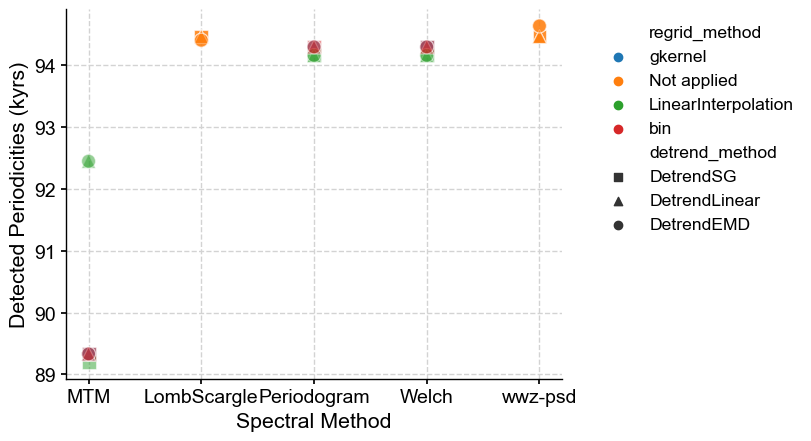

In [343]:
ax = sns.scatterplot(df_spectral_summary, x = 'spectral_method', y = 'eccentricity', hue = 'regrid_method', 
                     style = 'detrend_method', markers=['s','^','o'], legend='brief', s=100, alpha=0.5)
ax.set_xlabel('Spectral Method')
ax.set_ylabel('Detected Periodicities (kyrs)')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

The various methods return consistent results regardless of pre-processing step and among themselves, with a periodicity identified near 94kyr, close to the 100kyr signal considering the number of frequency data points used to estimate the peaks around this periodicity.

##### Obliquity

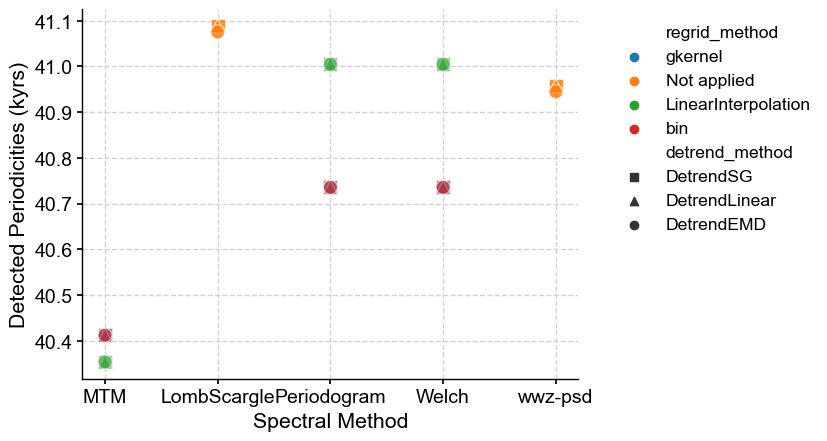

In [342]:
ax = sns.scatterplot(df_spectral_summary, x = 'spectral_method', y = 'obliquity', hue = 'regrid_method', 
                     style = 'detrend_method', markers=['s','^','o'], legend='brief', s=100, alpha=0.5)
ax.set_xlabel('Spectral Method')
ax.set_ylabel('Detected Periodicities (kyrs)')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

##### Precession

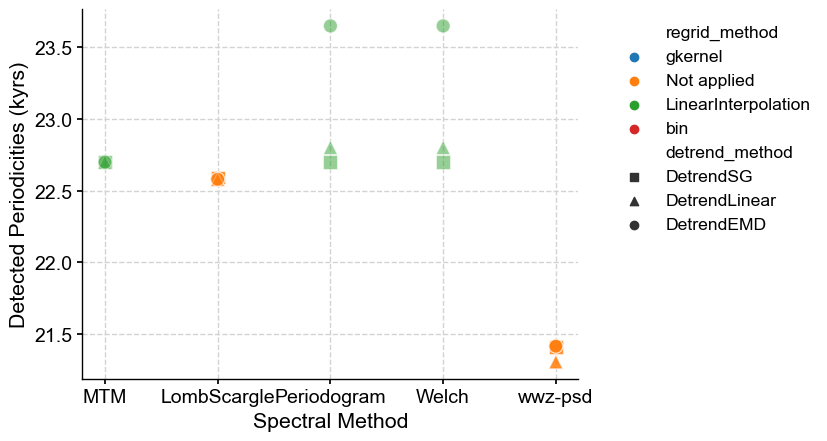

In [345]:
ax = sns.scatterplot(df_spectral_summary, x = 'spectral_method', y = 'precession', hue = 'regrid_method', 
                     style = 'detrend_method', markers=['s','^','o'], legend='brief', s=100, alpha=0.5)
ax.set_xlabel('Spectral Method')
ax.set_ylabel('Detected Periodicities (kyrs)')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

Despite noise, can identify periodicities with the largest amplitude within 1.5kyr of the known orbital forcing.

##### Prominent Periodicity

The peak with the higest power is defined here as the one standing the furthest away from the red noise curve. Let's plot the distribution across all 45 workflows:

Text(0.5, 0, 'Most Prominent Periodicity (kyr)')

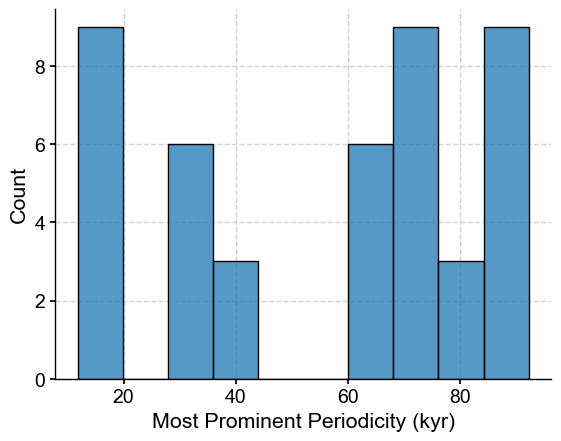

In [31]:
ax = sns.histplot(df_spectral_summary['strongest_cycle'], bins = 10)
ax.set_xlabel('Most Prominent Periodicity (kyr)')

Let's investigate whether this spread can be traced to the methods:

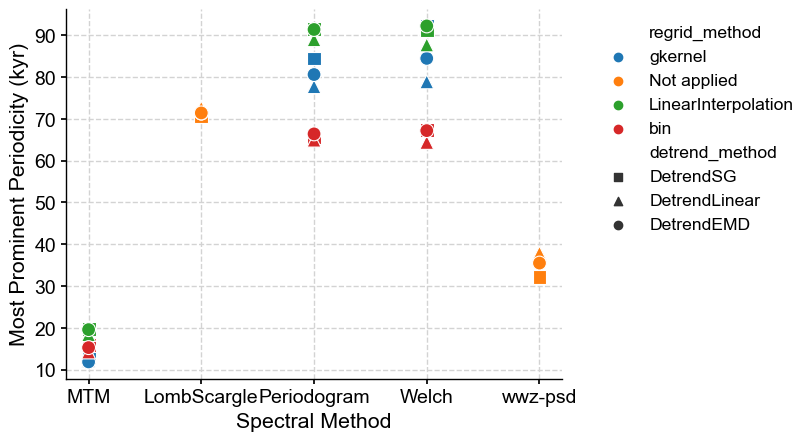

In [30]:
ax = sns.scatterplot(df_spectral_summary, x = 'spectral_method', y = 'strongest_cycle', hue = 'regrid_method', 
                     style = 'detrend_method', markers=['s','^','o'], legend='brief', s=100)
ax.set_xlabel('Spectral Method')
ax.set_ylabel('Most Prominent Periodicity (kyr)')
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

For each of the spectral method, the choice of detrending method doesn't singiifcantly affect the location of the most prominetn peak. For methods requiring regridding, the method has an influence on the location of the peak. However it is interested to note that the method that are more prone to variance problems (Lomb-Scargle, Periodogram and Welch) have theirs most prominent peaks ~80ky, while MTM and WWZ tend to have more prominent periodicities in higher frequencies.

This analysis highlights the fact that although the record displays significant periodicities in the orbital band, it is difficult to assign it to a particular orbital forcing or even assign a dominant periodicity. If using a single workflow (single pre-processing pipeline and spectral method), caution is warranted as to not over-interpret the findings. 

## Wavelet analysis

Wavelet analysis not only informs us about power in frequency bands but also when that power was present. In other words, it allows to determine whether the power is intermittent. PaleoTS uses the following wavelet analysis template:

<img src="images/wavelet_workflow.svg">

**Figure 2**: Abstract wavelet analysis template.

It shares the same pre-processing steps as the spectral analysis workflow.

The parameters (in green in Figure 2) were set as followed:
* `TSID`: NA - This parameter is not needed when using a JSON input
* `remove`: This controls whether to remove outliers in a timeseries. It was set to `False` since we have already established that outliers would not singificantly impact the analysis, if detected at all.
* `start` and `stop` refers to the interval to consider for regridding. We used default values (which means to let Pyleoclim use the minimum and maximum time.
* `freq_method`: For `wwz`, `cwt`, and `lomb-scargle`, sets the method by which to obtain the [frequency vector](https://pyleoclim-util.readthedocs.io/en/v0.9.1/core/api.html#pyleoclim.core.series.Series.spectral). For this analysis, we set it to `lomb_scargle`.
* `qs` sets the red noise significance level. We used the default value of 0.95. 

In [7]:
execs = execution_api.list_executions_by_page(pattern="WaveletAnalysis*")

In [14]:
start_string = "02/24/2023 8:00:00-08:00" #Date and Time of the start of the runs, -08:00 accounts for PST timezone
start = time.mktime(datetime.datetime.strptime(start_string, '%m/%d/%Y %H:%M:%S%z').timetuple()) #convert to datetime

end_string = "02/24/2023 12:00:00-08:00"
end = time.mktime(datetime.datetime.strptime(end_string, '%m/%d/%Y %H:%M:%S%z').timetuple()) #convert to datetime

In [15]:
full_execs = []
if execs["success"]:
    for ex in execs["rows"]:
        runid = ex["id"].split("#")[1]
        status = ex["runtimeInfo"]["status"]
        startTime = ex["runtimeInfo"]["startTime"]
        if status == "SUCCESS" and startTime >= start and startTime <= end:
            #print(str(len(full_execs) + 1) + ". Run id: " + runid)
            exec = execution_api.get_run_details(runid)
            full_execs.append(exec)

Let's create our results dataframe, keeping only the results of the wavelet analysis: 

In [17]:
df = None
all_rows = []
for exec in full_execs:
    steps = exec["execution"]["plan"]["steps"]
    cvalues = {}
    for step in steps:
        cname = step["codeBinding"]["codeDirectory"].split("/")[-1]
        cvalues[cname] = True

    params = get_execution_parameters(exec)
    input_files = get_execution_files(exec, ["input"], ["InputTS"])
    output_files = get_execution_files(exec, ["intermediate", "output"], ["OutputScalogram","OutputScalSig"])

    row = dict(params)
    row.update(input_files)
    row.update(output_files)
    row.update(cvalues)

    if df is None:
        df = pd.DataFrame()
    
    df = pd.concat([df, pd.DataFrame([row])], ignore_index=True)

df

,step,TSID,freq_method,pad,polyorder,eval,seed,windowLength,deriv,mother,...,nbr_clusters,n_neighbors,metric,min_samples,eps,DBSCAN,DetrendLinear,NoDetrending,n,DetrendEMD
0,-1.0,NA,log,true,2,0.0,-1,-1,0,MORLET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1.0,NA,log,NaN,2,0.0,-1,-1,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-1.0,NA,log,true,2,0.0,-1,-1,0,MORLET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-1.0,NA,log,true,2,0.0,-1,-1,0,MORLET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NA,log,true,2,0.0,-1,-1,0,MORLET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,-1.0,NA,log,NaN,NaN,NaN,-1,NaN,NaN,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,True,NaN,NaN
60,-1.0,NA,log,NaN,NaN,NaN,-1,NaN,NaN,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,1,True
61,NaN,NA,log,NaN,NaN,NaN,-1,NaN,NaN,NaN,...,-1,-1,euclidean,-1,-1.0,True,True,NaN,NaN,NaN
62,NaN,NA,log,NaN,NaN,NaN,-1,NaN,NaN,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,True,NaN,NaN


Since we have already investigated the effects of pre-processing on the time series, let's keep the following pre-processing pipeline (which is the same as what we have kept for the spectral analysis):

- Detrending using the linear, Savitzy-Golay, or EMD.
- No removal of outliers (Therefore, set DBSCAN to true and ingore the results from kmeans since they will be essentially the same.)
- For methods requiring regridding: linear interpolation, binning and gkernel.

In [18]:
df_out = df[df['DBSCAN']==True][df['NoDetrending'].isna()][df['SplineInterpolation'].isna()]
df_out

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_13694/703204810.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_out = df[df['DBSCAN']==True][df['NoDetrending'].isna()][df['SplineInterpolation'].isna()]


,step,TSID,freq_method,pad,polyorder,eval,seed,windowLength,deriv,mother,...,nbr_clusters,n_neighbors,metric,min_samples,eps,DBSCAN,DetrendLinear,NoDetrending,n,DetrendEMD
5,-1.0,NA,log,true,2,0.0,-1,-1,0,MORLET,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,NaN,NaN
12,-1.0,NA,log,NaN,2,0.0,-1,-1,0,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,NaN,NaN
20,-1.0,NA,log,true,2,0.0,-1,-1,0,MORLET,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,NaN,NaN
24,NaN,NA,log,true,2,0.0,-1,-1,0,MORLET,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,NaN,NaN
28,-1.0,NA,log,true,NaN,NaN,-1,NaN,NaN,MORLET,...,-1,-1,euclidean,-1,-1.0,True,True,NaN,NaN,NaN
30,-1.0,NA,log,true,NaN,NaN,-1,NaN,NaN,MORLET,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,1,True
35,-1.0,NA,log,NaN,2,0.0,-1,-1,0,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,NaN,NaN
39,NaN,NA,log,NaN,2,0.0,-1,-1,0,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,NaN,NaN
43,-1.0,NA,log,NaN,NaN,NaN,-1,NaN,NaN,NaN,...,-1,-1,euclidean,-1,-1.0,True,True,NaN,NaN,NaN
45,-1.0,NA,log,NaN,NaN,NaN,-1,NaN,NaN,NaN,...,-1,-1,euclidean,-1,-1.0,True,NaN,NaN,1,True


In [353]:
df_out.columns

Index(['start', 'eval', 'stop', 'freq_method', 'step_type', 'step', 'remove',
       'nbr_cluster', 'TSID', 'h', 'threshold', 'delta', 'pad', 'seed',
       'mother', 'max_clusters', 'polyorder', 'windowLength', 'mode', 'deriv',
       'number', 'qs', 'InputTS', 'OutputScalogram', 'OutputScalSig', 'cwt',
       'kmeans', 'loadJSON', 'AR1sim-wave', 'DetrendSG', 'gkernel',
       'standardize', 'reflect_type', 'c', 'nproc', 'bc_mode', 'Neff_coi',
       'Neff', 'wwz', 'extrapolate', 'SplineInterpolation',
       'LinearInterpolation', 'bin', 'min_samples', 'nbr_clusters', 'metric',
       'n_neighbors', 'eps', 'DBSCAN', 'DetrendLinear', 'NoDetrending', 'n',
       'DetrendEMD'],
      dtype='object')

### Weighted Wavelet Z-Transform

Since this method doesn't require regridding and we have previously established that the removal outliers is not necessary for this time series, we will only look at the effects of the detrending method on the results. 

In [19]:
detrend_opt = ['DetrendSG','DetrendLinear','DetrendEMD']
scal_wwz =[]

for item in detrend_opt:
    file = df_out[df_out[item]==True][df_out['wwz']==True]['OutputScalSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        scal=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'Scalogram')
        scal.label = item
        scal_wwz.append(scal)

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_13694/354397714.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df_out[df_out[item]==True][df_out['wwz']==True]['OutputScalSig'].unique()


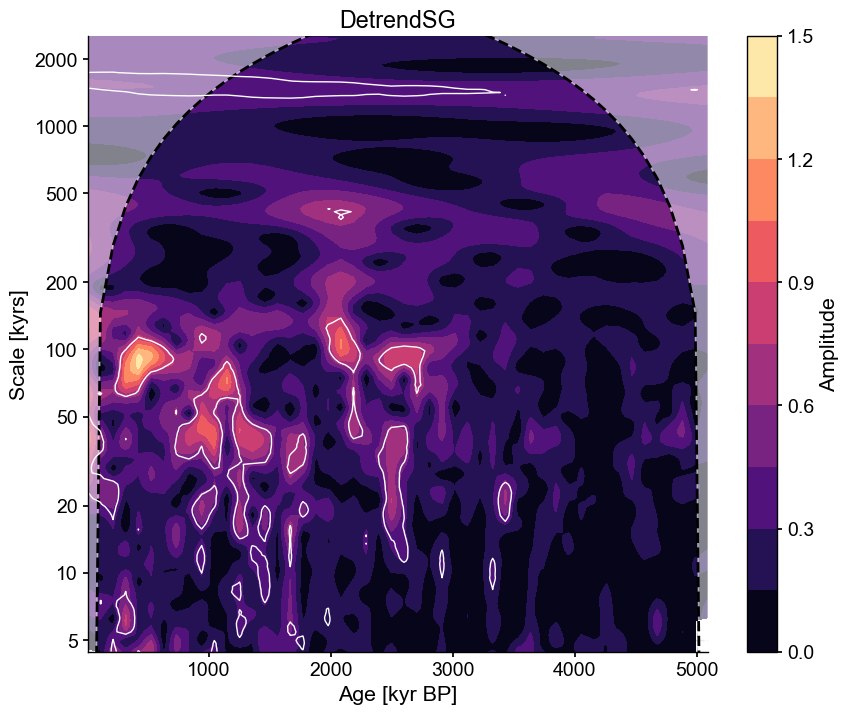

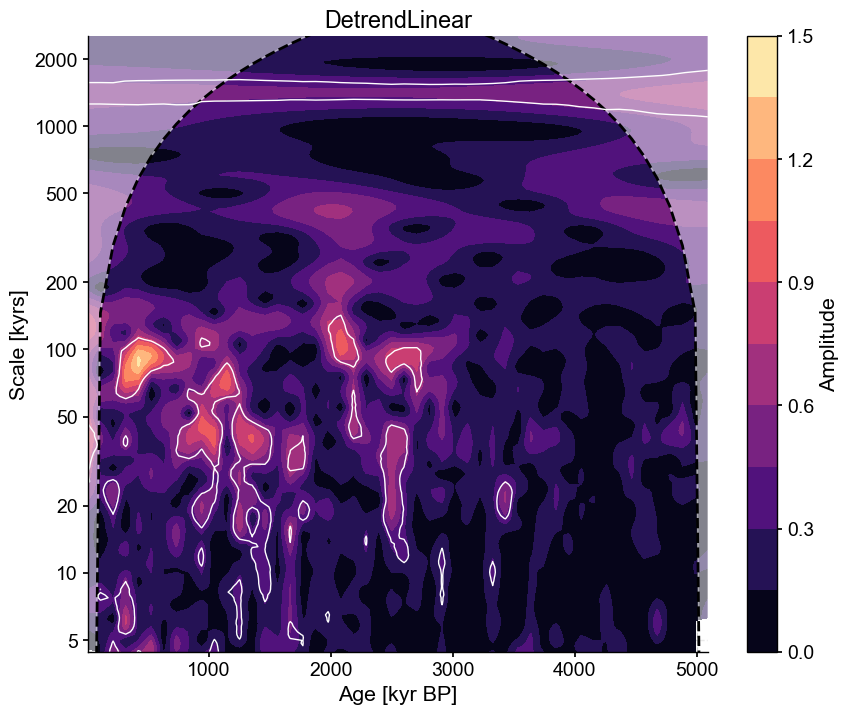

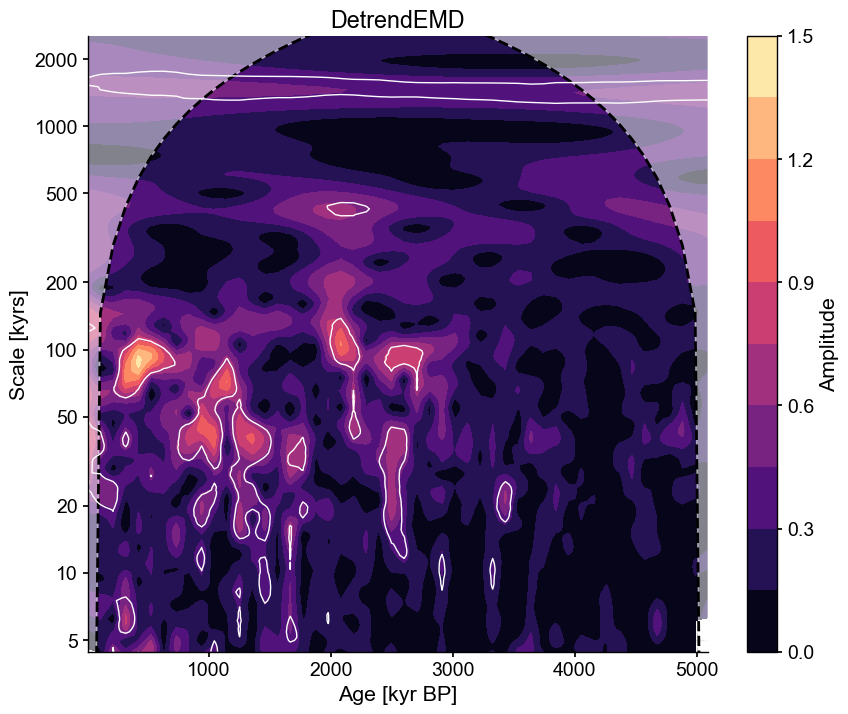

In [20]:
for item in scal_wwz:
    item.plot(title=item.label)

The detrending method does not affect the results of the wavelet analysis. The record broadly displays periodiciteis in the orbital band (23-100kyr). Noticeably, the 100-kyr power extends beyond the mid-Pleistocene transition at 1.8Myr BP.

Although the SST record displays significant periodicities throughout the band, they are not necessarily aligned with the well-defined precession, obliquity, and precession bands. This conclusion is in line with what has been observed from spectral analysis alone.

### Continuous wavelet transform

The continuous wavelet transform used by PaleoTS has been developed by [Torrence and Compo (1998)](https://github.com/ct6502/wavelets). This method requires evenly-spaced data. Therefore, in addition to examing the effect of detrending on the results produced by this method, we will also look at the effect of the regridding method. 

#### Effects of detrending

In [21]:
detrend_opt = ['DetrendSG','DetrendLinear','DetrendEMD']
scal_wwz =[]

for item in detrend_opt:
    file = df_out[df_out[item]==True][df_out['cwt']==True][df_out['LinearInterpolation']==True]['OutputScalSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        scal=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'Scalogram')
        scal.label = item
        scal_wwz.append(scal)

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_13694/992173461.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df_out[df_out[item]==True][df_out['cwt']==True][df_out['LinearInterpolation']==True]['OutputScalSig'].unique()


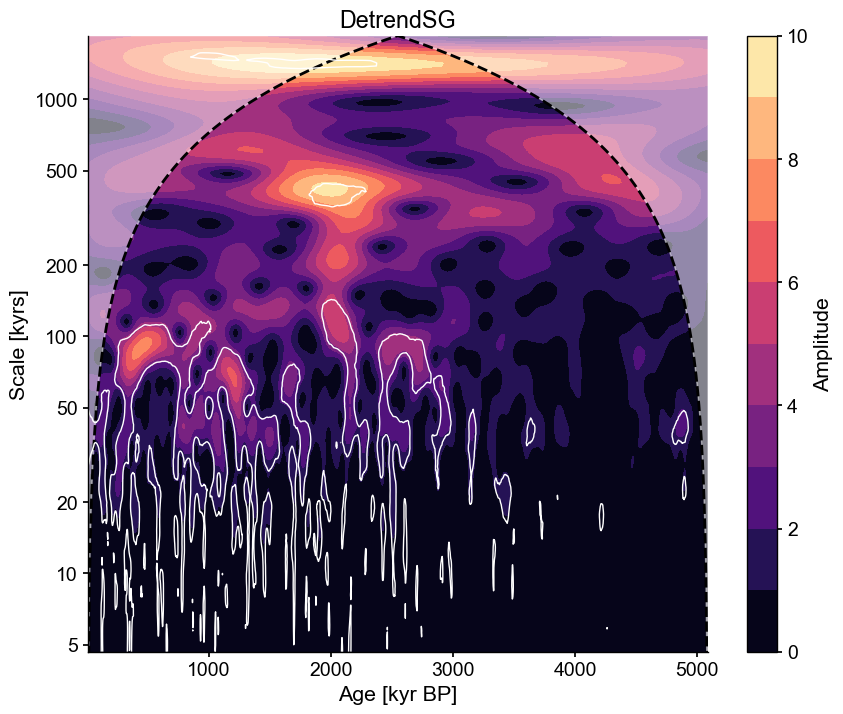

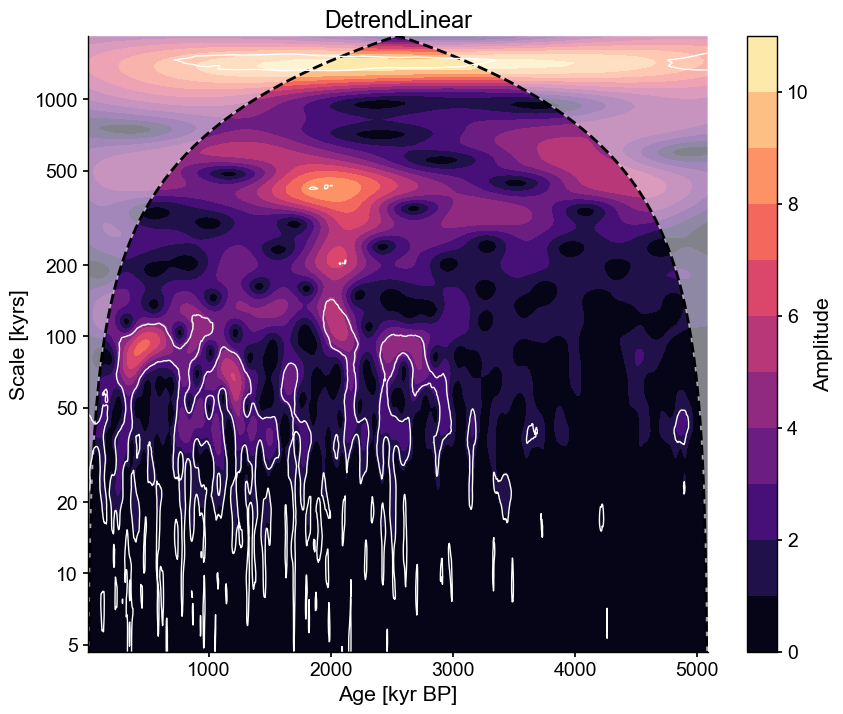

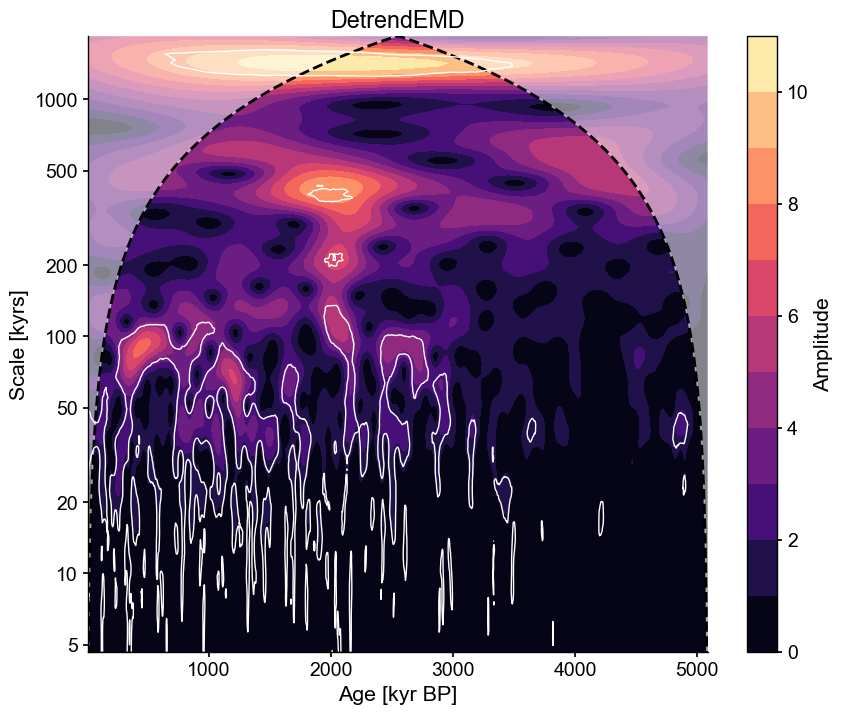

In [22]:
for item in scal_wwz:
    item.plot(title=item.label)

Similarly to the results obtained through the WWZ method, the detrending method doesn't significantly impact the results of the analysis.

#### Effects of regridding

In [29]:
regrid_opt = ['LinearInterpolation','gkernel','bin']
scal_per =[]

for item in regrid_opt:
    file = df_out[df_out['DBSCAN']==True][df_out[item]==True][df_out['DetrendEMD']==True][df_out['cwt']==True]['OutputScalSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        scal=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'Scalogram')
        scal.label = item
        scal_per.append(scal)

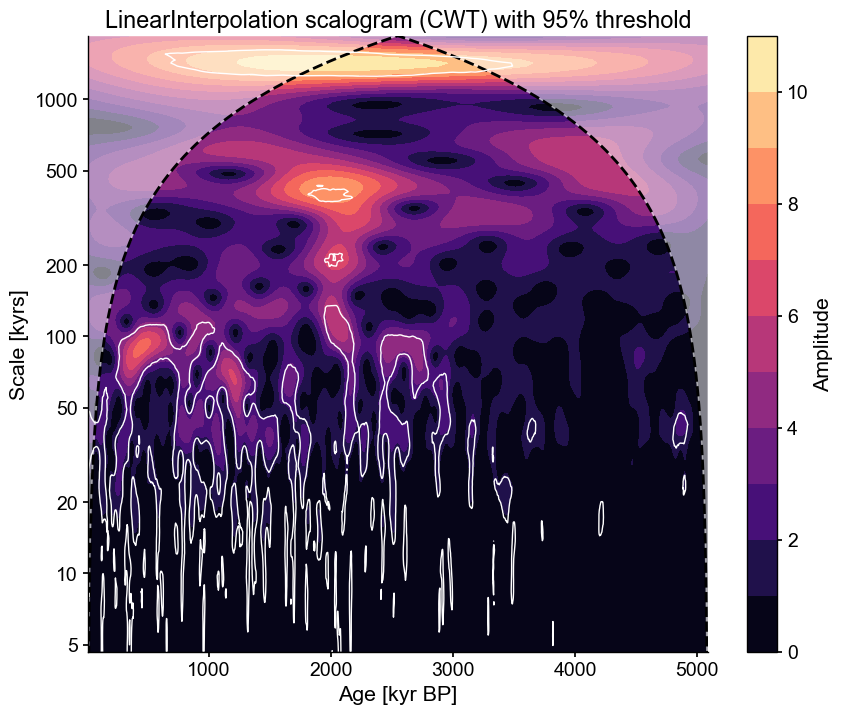

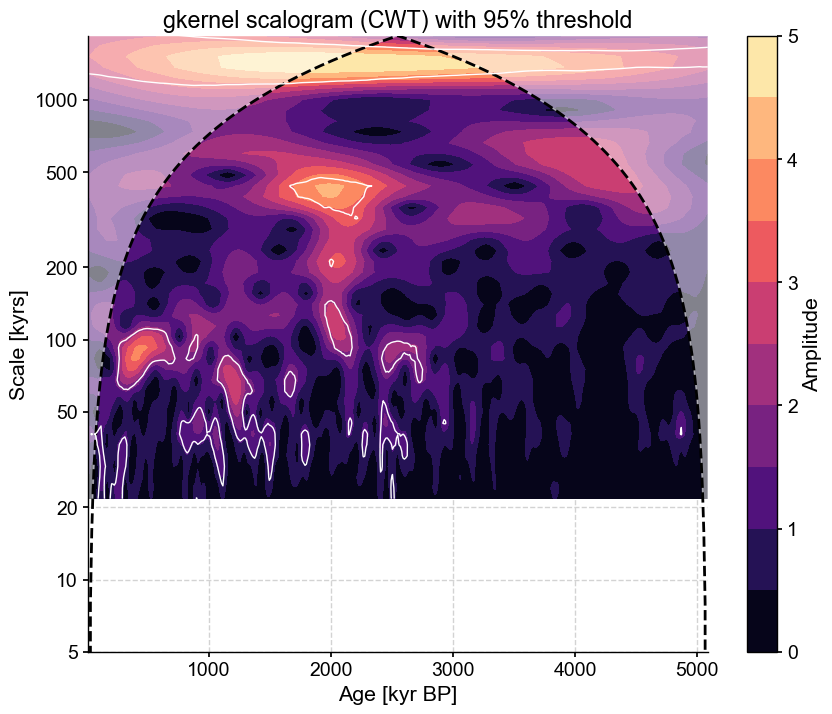

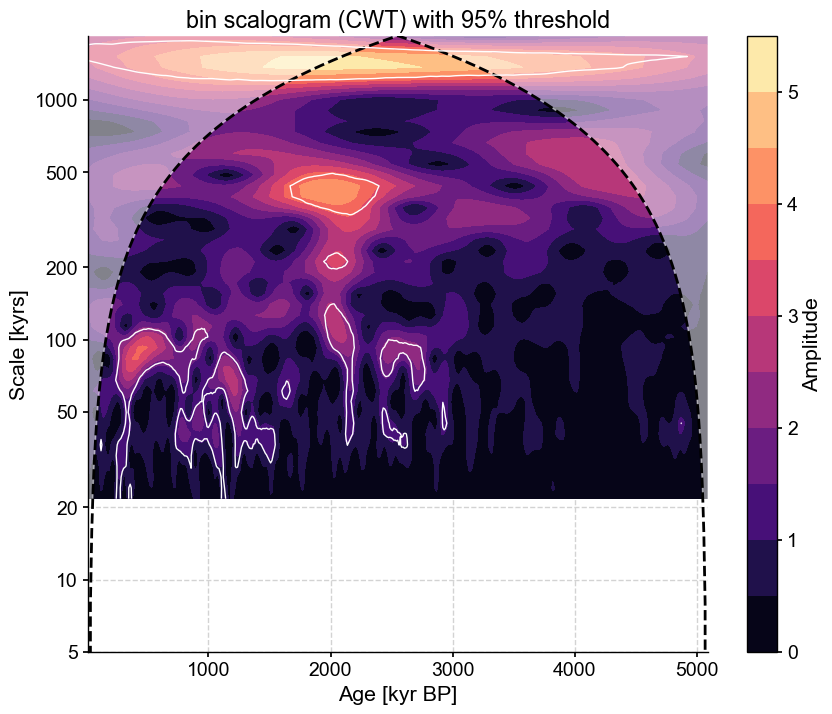

In [31]:
for scal in scal_per:
    yticks = [5,10,20,50,100,200,500,1000]
    fig,ax = scal.plot()
    ax.set_yticks(yticks)

Overall, the regridding method doesn't affect the overall results. As seen with the spectral analysis, coarsening methods may not be appropriate for this study since the largest `dt` is on the order of 10kyr, but this is an outlier. Coarsening the series ignores important periodicities. 

Therefore, we will be using linear interpolation as the regridding technique.

### Comparison between WWZ and the traditional continuous wavelet transform

For comparison purposes, let's use the EMD detrending method and linear interpolation for cwt. 

In [33]:
method_opt = ['wwz','cwt']
scal_method =[]

for item in method_opt:
    file = df_out[df_out['DBSCAN']==True][df_out['DetrendEMD']==True][df_out['LinearInterpolation']==True][df_out[item]==True]['OutputScalSig'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        scal=pyleo.utils.jsonutils.json_to_PyleoObj(file[0], 'Scalogram')
        scal.label = item
        scal_method.append(scal)

<AxesSubplot: title={'center': 'cwt scalogram (CWT) with 95% threshold'}, xlabel='Age [kyr BP]', ylabel='Scale [kyrs]'>

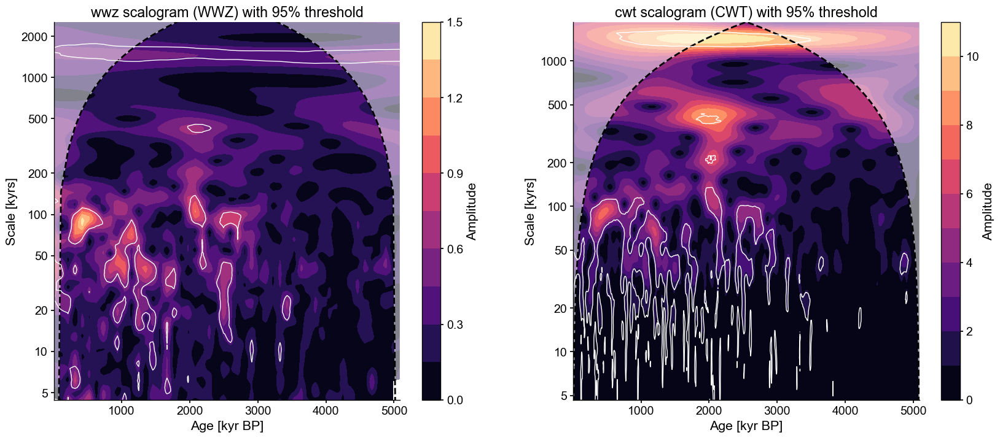

In [39]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=[20,8])
scal_method[0].plot(ax=axs[0])
scal_method[1].plot(ax=axs[1])

The two methods qualitatively return similar results: significant power in the orbital bands; however, the power is intermittent and not distributed in bands centered around known orbital cyclicities. This reinforces the results from the spectral analysis in which not single orbital power could be identified and the areas of maximum power are highly dependent on the methods used in the analysis. In this case, the difference between the traditional cwt method and WWZ is striking, even more so than the choice of pre-processing steps. 

## Cross-wavelet analysis

Let's examine the relationship between our sea surface temperature record and insolation at 5S. We will use ClimLab to obtain the insolation at 5S, which is calculated from orbital cycles.

/Users/deborahkhider/opt/anaconda3/envs/paleodev/lib/python3.9/site-packages/xarray/core/missing.py:559: FutureWarning: Passing method to Int64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/Users/deborahkhider/opt/anaconda3/envs/paleodev/lib/python3.9/site-packages/xarray/core/missing.py:560: FutureWarning: Passing method to Int64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")


(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Age [ky BP]', ylabel='Insolation at 5 $^\\circ$S [$W/m^{2}$]'>)

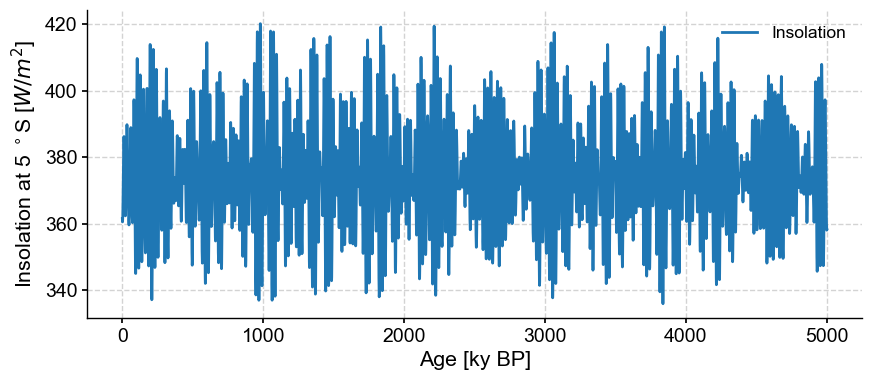

In [2]:
# array with specified kyears
years = np.linspace(-5000, 0, 5001)

# subset of orbital parameters for specified time
orb = OrbitalTable.interp(kyear=years)

# insolation values for past 3 Myears at 5S at summer solstice (day 172)
S5 = daily_insolation(lat=-5, day=172, orb=orb)

# put in a Pyleoclim.Series object
sol = pyleo.Series(time=-years,value=S5,value_name='Insolation at 5 $^\circ$S',value_unit='$W/m^{2}$',
                   time_name='Age',time_unit='ky BP',label='Insolation')

sol.plot()

By design, this timeseries is evenly-spaced, with no outliers (mathematical model outputs) and no trends (note that PaleoTS also did not detect any trends in the data and skipped this step in all executions as well). Let's run MTM to check on the periodcities:

In [4]:
psd = sol.spectral(method='mtm').signif_test(number=1000)

Performing spectral analysis on individual series: 100%|█| 1000/1000 [03:47<00:0


(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Period [kyrs]', ylabel='PSD'>)

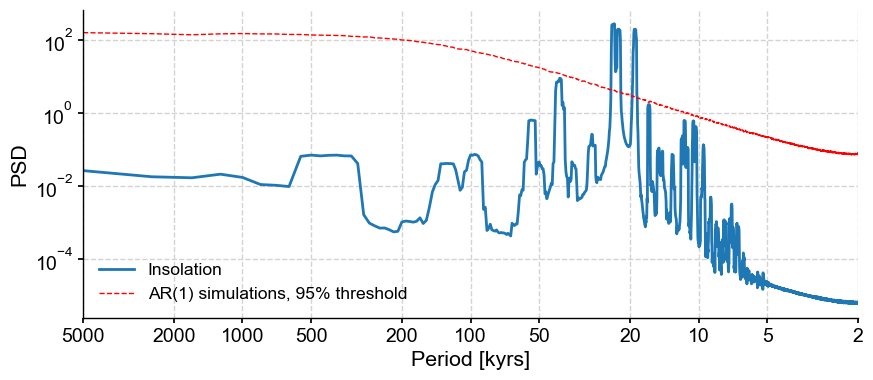

In [5]:
psd.plot()

Not unsurprisingly for insolation at 5s, the precession peak around 23kyr is prominent in the record. Let's save the series for use in PaleoTS:

In [6]:
pyleo.utils.PyleoObj_to_json(sol.copy(), 'ins_5s.json')

The cross-wavelet analysis workflow employs the following steps:

<img src="images/xwavelet_workflow.svg">

**Figure 3**: Abstract cross-wavelet analysis template.

Note the pre-processing steps are very similar as for spectral and wavelet analysis:
* Identification of a common interval upoin which to perform the analysis. Note that this step is different from regridding. Here, the series are truncated to allow for the same time interval, regardless of the actual time values. The reason to perform this step first has to do with the other pre-processing steps, and in particular detrending and outlier removals which may have different results if only a portion of the time series is considered.In our case, this step will essentially return the same series since we aligned the mathematical model output to the time span in the SST data.
* standardization
* detrending
* removal of outliers
* regridding, for methods requiring an even and common time axis among the two time series.

Note that the pre-processing steps between the two series are mostly independent of each other. Detrending and outliers removal can be performed independently with any combinations of the methods described above (e.g., one series removing outliers through k-means and the other through DBSCAN). On the other hand, we use the same regridding method for both series when needed (i.e., linear interpolation for both series). 

In [8]:
execs = execution_api.list_executions_by_page(pattern="XWavelet*", limit =10000)

In [11]:
start_string = "04/12/2023 17:30:00 -0700" #Date and Time of the start of the runs, -08:00 accounts for PST timezone
start = time.mktime(datetime.datetime.strptime(start_string, '%m/%d/%Y %H:%M:%S %z').timetuple()) #convert to datetime

end_string = "04/12/2023 18:10:00 -0700"
end = time.mktime(datetime.datetime.strptime(end_string, '%m/%d/%Y %H:%M:%S %z').timetuple()) #convert to datetime

In [18]:
full_execs = []
if execs["success"]:
    for ex in execs["rows"]:
        runid = ex["id"].split("#")[1]
        status = ex["runtimeInfo"]["status"]
        startTime = ex["runtimeInfo"]["startTime"]
        if status == "SUCCESS" and startTime >= start and startTime <= end:
            #print(str(len(full_execs) + 1) + ". Run id: " + runid)
            exec = execution_api.get_run_details(runid)
            full_execs.append(exec)

Because we have explored much of the effect of pre-processing on the SST data and the mathematical model output doesn't require extensive pre-processing, let's concentrate on the outputs from the common time axis and cross-wavelet analysis steps:

In [47]:
df = None
all_rows = []
step_dup = ["NoDetrending","DetrendSG","DetrendLinear","DetrendEMD","DBSCAN","kmeans"] #list of steps that 

for exec in full_execs:
    steps = exec["execution"]["plan"]["steps"]
    cvalues = {}
    for step in steps:
        cname_base = step["codeBinding"]["codeDirectory"].split("/")[-1]
        if cname_base in step_dup:
            iname = step["inputFiles"][0]['id'].split("#")[-1]
            cname = cname_base+"-"+iname
        else:
            cname = cname_base
        cvalues[cname] = True

    params = get_execution_parameters(exec)
    input_files = get_execution_files(exec, ["input"], ["InputTS", "InputTS1"])
    output_files = get_execution_files(exec, ["intermediate", "output"], ["OutputTS12","OutputTS21", "OutputCoherencePlot"])

    row = dict(params)
    row.update(input_files)
    row.update(output_files)
    row.update(cvalues)

    if df is None:
        df = pd.DataFrame()
    
    df = pd.concat([df, pd.DataFrame([row])], ignore_index=True)

df

,polyorder,metric_0001,eps_0001,remove1,step,n_neighbors,TSID,metric,eps,number,...,wwz_coherence,threshold_0001,max_clusters_0001,eval_0001,polyorder_0001,mode_0001,nbr_cluster_0001,windowLength_0001,deriv_0001,delta_0001
0,2,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
472,NaN,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
473,NaN,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
474,NaN,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
475,NaN,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There are 476 runs. However, most of these runs result in the same/similar outputs as PaleoTS plan each execution separately. For instance, although the insolation data does not need to be detrended, PaleoTS will still plan on using all options and then skip this step. Each of these executions correspond to a row in the dataframe above although the output (OutputTS6 in Figure 3) of the detrending option will remain the same across all executions.

In [48]:
df.columns

Index(['polyorder', 'metric_0001', 'eps_0001', 'remove1', 'step',
       'n_neighbors', 'TSID', 'metric', 'eps', 'number', 'mother',
       'nbr_clusters_0001', 'stop_interval', 'min_samples', 'mode', 'delta',
       'qs', 'TSID1', 'n_neighbors_0001', 'eval', 'seed', 'start_interval',
       'remove', 'deriv', 'freq_method', 'pad', 'windowLength', 'nbr_clusters',
       'min_samples_0001', 'step_style', 'InputTS', 'InputTS1', 'OutputTS21',
       'OutputTS12', 'OutputCoherencePlot', 'DetrendSG-OutputTS3',
       'CommonInterval-Default', 'cwt_coherence', 'AR1sim-xwave',
       'CommonTime-interp', 'DBSCAN-OutputTS5', 'loadJSON', 'standardize',
       'DBSCAN-OutputTS6', 'DetrendLinear-OutputTS4', 'max_clusters',
       'nbr_cluster', 'threshold', 'DetrendLinear-OutputTS3',
       'kmeans-OutputTS5', 'NoDetrending-OutputTS3', 'n',
       'DetrendEMD-OutputTS3', 'NoDetrending-OutputTS4',
       'DetrendEMD-OutputTS4', 'n_0001', 'DetrendSG-OutputTS4',
       'kmeans-OutputTS6', 'CommonTim

Let's keep the following runs:

* CommonInterval: There is only one option 
* Detrending:
    * Linear, EMD, and Savitzky-Golay for the ODP SST temperature (InputTS) 
    * NoDetrending for the insolation data (InputTS1) - Since there is no trend in the data, this step is skipped in every planning. 
* Removal of outliers:
    * Let's keep the DBSCAN option (remove has been set to false) for both. Remember that since we are not removing the outliers (`remove` parameter is set to False), we essentially do nothing to the output.
* CommonTimeAxis: This is only needed for `cwt` and we will keep all options. 

In [49]:
df_out = df[df['DBSCAN-OutputTS6']==True][df['DBSCAN-OutputTS5']==True][df['NoDetrending-OutputTS3'].isna()][df['NoDetrending-OutputTS4']==True]
df_out

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_4551/4062208775.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_out = df[df['DBSCAN-OutputTS6']==True][df['DBSCAN-OutputTS5']==True][df['NoDetrending-OutputTS3'].isna()][df['NoDetrending-OutputTS4']==True]


,polyorder,metric_0001,eps_0001,remove1,step,n_neighbors,TSID,metric,eps,number,...,wwz_coherence,threshold_0001,max_clusters_0001,eval_0001,polyorder_0001,mode_0001,nbr_cluster_0001,windowLength_0001,deriv_0001,delta_0001
4,2,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28,2,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51,NaN,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,NaN,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60,NaN,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62,NaN,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
69,NaN,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
71,NaN,euclidean,-1.0,false,NaN,-1,NA,euclidean,-1.0,200,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78,NaN,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,NaN,euclidean,-1.0,false,-1.0,-1,NA,euclidean,-1.0,200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We are left with 30 runs to explore. 

### Weighted Wavelet Z-Transform

Since this method doesn't require regridding to a common axis and we have previously established that the removal outliers is not necessary  let's have a look at the effect of detrending of the ODP846 series on the cross-wavelet output: 

In [56]:
detrend_opt = ['DetrendSG-OutputTS3','DetrendLinear-OutputTS3','DetrendEMD-OutputTS3']
coh_wwz =[]

for item in detrend_opt:
    file = df_out[df_out[item]==True][df['wwz_coherence']==True]['OutputCoherencePlot'].unique()
    if len(file)>1:
        raise ValueError('Should only get one unique file from this query')
    else:
        coh_wwz.append(file)

coh_wwz

/var/folders/xj/p7h9764x7cx0by8547l04rrr0000gn/T/ipykernel_4551/2595919917.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  file = df_out[df_out[item]==True][df['wwz_coherence']==True]['OutputCoherencePlot'].unique()


[array(['data/OutputCoherencePlot-bbyem6j5k1cxu45k111lqhh6h.png'],
       dtype=object),
 array(['data/OutputCoherencePlot-dzduehpms85lumoirrm2nbnrn.png'],
       dtype=object),
 array(['data/OutputCoherencePlot-8imj88k0v5y53azycxdsivpbt.png'],
       dtype=object)]

Detrending method: DetrendSG-OutputTS3


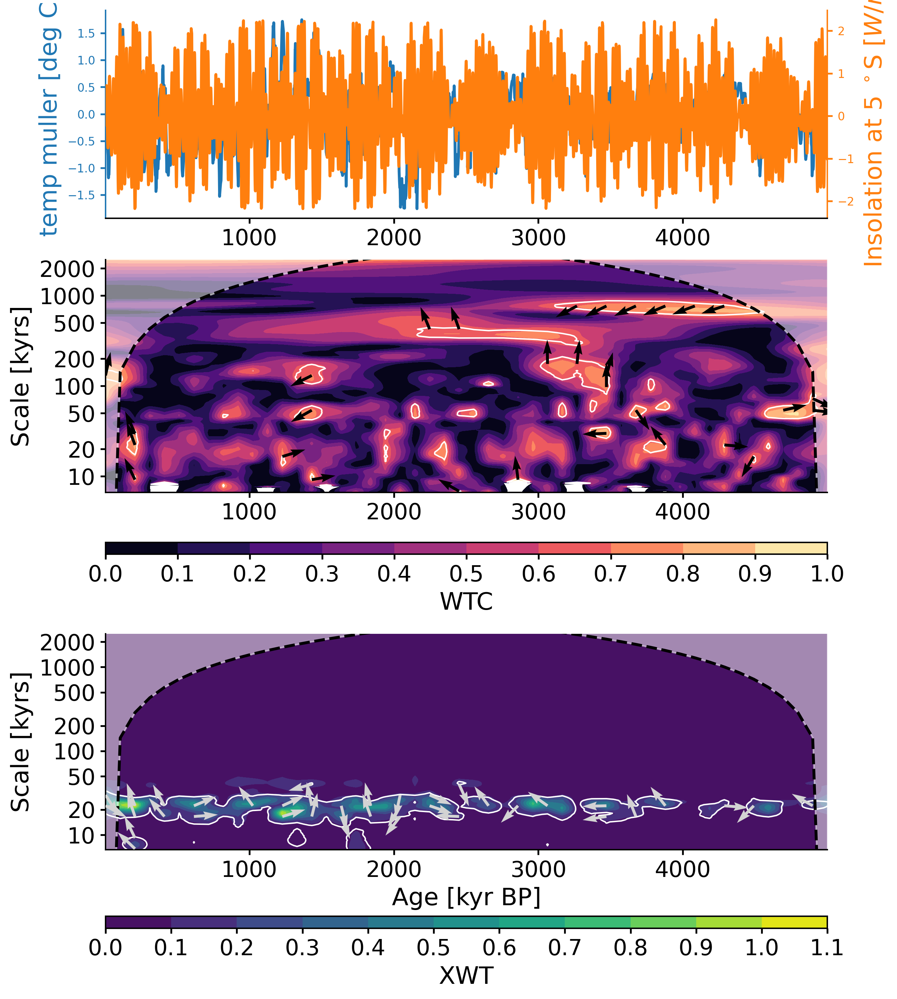

In [53]:
from IPython.display import Image
idx = 0

print('Detrending method: '+detrend_opt[idx])
Image(coh_wwz[idx][0])

XWT (cross-wavelet transform) informs about areas where there is high common power between the two series. The analysis reveals high common power in the precession band (~23kyr) but the phase angles are irregular. This is most likely due to the high uncertainty associated with the age determination on paleoclimate data. Even if there was a regular behavior, the age uncertainty prevents us from capturing it in the analysis.

WTC (wavelet transform coherence) shows areas of common behavior between the two time series even if there is low power. There is some coherence in the ~23kyr, ~40-50kyr, ~100kyr band but these areas of coherence are intermittent. 

Detrending method: DetrendLinear-OutputTS3


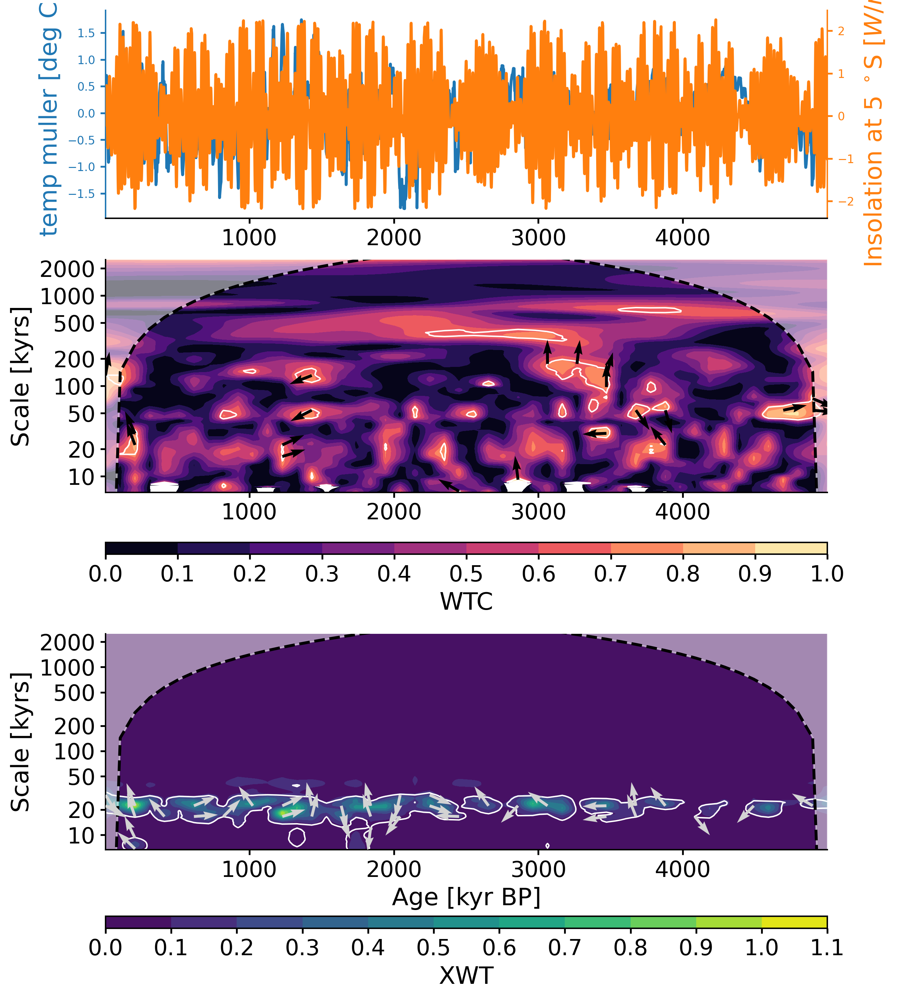

In [54]:
from IPython.display import Image
idx = 1

print('Detrending method: '+detrend_opt[idx])
Image(coh_wwz[idx][0])

The cross-wavelet transform reveals the same pattern of high common power in the precession band (~23kyr) (with no regular phase angles). However, the wavelet transform coherence is quite different with this particular detrending method, with even less power in the bands that would correpond to orbital variations. 

Detrending method: DetrendEMD-OutputTS3


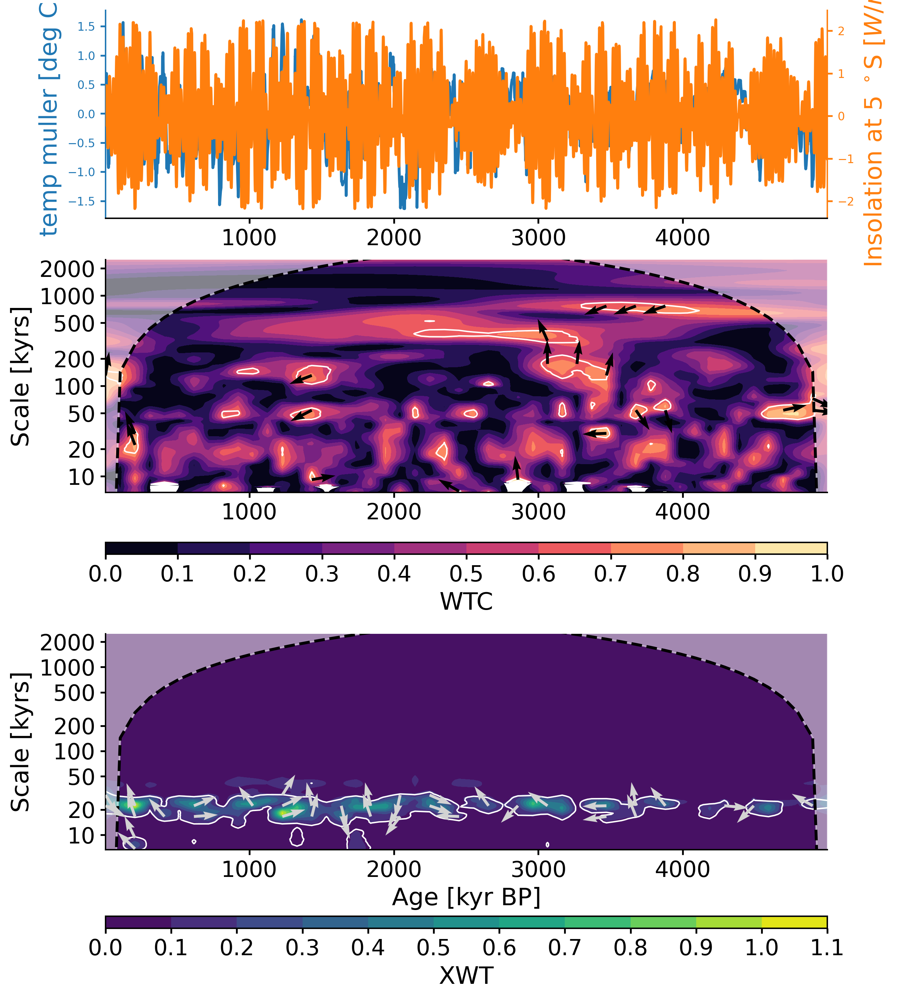

In [55]:
from IPython.display import Image
idx = 2

print('Detrending method: '+detrend_opt[idx])
Image(coh_wwz[idx][0])

Considering all detrending option, the cross-wavelet transform shows high common power in the precession band. However, the age uncertainty on the SST record prevent any meaningful interpretation of the phase angle. The coherence results are highly dependent of the detrending method. This is not surprising, since this analysis looks for common behavior even if there is low power and should, therefore be interpreted with caution. Taking all pre-processing methods into account, there is some coherence in the orbital bands. But this coherence is highly intermittent, with the timing of the coherence and associated phase angle dependent on the pre-processing method. 